<a href="https://colab.research.google.com/github/deeprajbasu/MachineLearningCore/blob/main/Fundamentals_of_deep_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

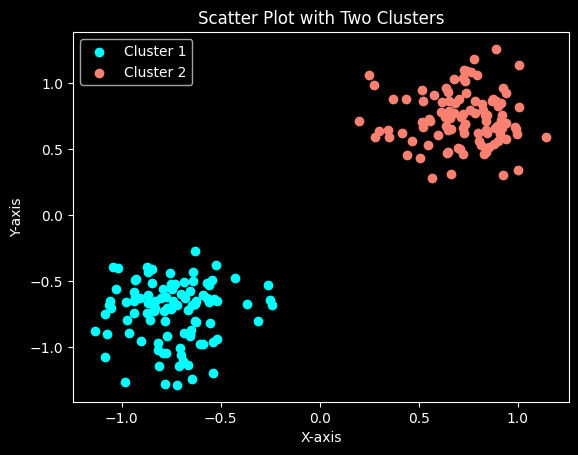

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Enable dark mode for the plot
plt.style.use('dark_background')

# Generate first cluster (centered around (-0.5, -0.5))
n=0.73111
size = 100
x1 = np.random.normal(loc=-n, scale=0.2, size=size)
y1 = np.random.normal(loc=-n, scale=0.2, size=size)

# Generate second cluster (centered around (0.5, 0.5))
x2 = np.random.normal(loc=n, scale=0.2, size=size)
y2 = np.random.normal(loc=n, scale=0.2, size=size)

# Create the scatter plot for both clusters
plt.scatter(x1, y1, color='cyan', label='Cluster 1')
plt.scatter(x2, y2, color='salmon', label='Cluster 2')

# Add labels, title, and legend
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Scatter Plot with Two Clusters')
plt.legend()

# Show the plot
plt.show()


In [ ]:
# Stack the data for both clusters
X = np.vstack((np.column_stack((x1, y1)), np.column_stack((x2, y2))))
# Labels: 0 for Cluster 1, 1 for Cluster 2
y = np.hstack((np.zeros(size), np.ones(size)))


In [ ]:
# Step 2: Implement a simple Perceptron
def perceptron_train(X, y, learning_rate=0.000000153, epochs=3000):
    # Initialize weights and bias
    weights = np.zeros(X.shape[1])  # Weights for the features
    bias = 0

    for epoch in range(epochs):
        for i in range(len(y)):
            # Perceptron prediction: step function
            activation = np.dot(X[i], weights) + bias
            prediction = 1 if activation >= 0 else 0

            # Update weights and bias if the prediction is wrong
            error = y[i] - prediction
            weights += learning_rate * error * X[i]
            bias += learning_rate * error

    return weights, bias



In [ ]:
# Train the perceptron
weights, bias = perceptron_train(X, y)
weights, bias

(array([2.04136266e-07, 2.42984649e-07]), 0.0)

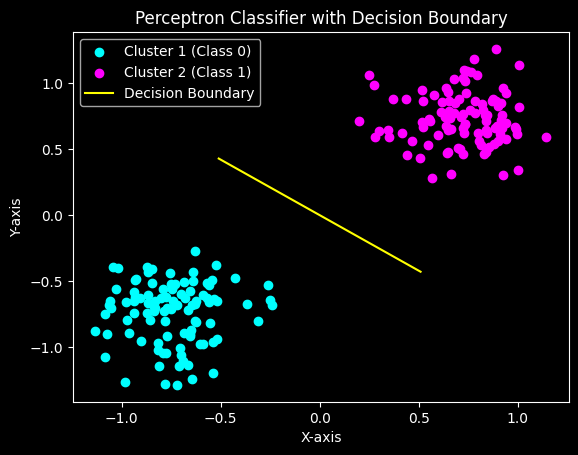

In [ ]:
# Step 3: Plot the clusters and the decision boundary
plt.scatter(x1, y1, color='cyan', label='Cluster 1 (Class 0)')
plt.scatter(x2, y2, color='magenta', label='Cluster 2 (Class 1)')

# Create the decision boundary: w0 * x + w1 * y + b = 0
x_values = np.linspace(-.51, .51, 25)
decision_boundary = -(weights[0] * x_values + bias) / weights[1]

# Plot the decision boundary
plt.plot(x_values, decision_boundary, color='yellow', label='Decision Boundary',)

# Add labels, title, and legend
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Perceptron Classifier with Decision Boundary')
plt.legend()

# Show the plot
plt.show()

In [ ]:
# for x,yy in zip(X,y):
#   print((np.dot(weights,x))<=0)

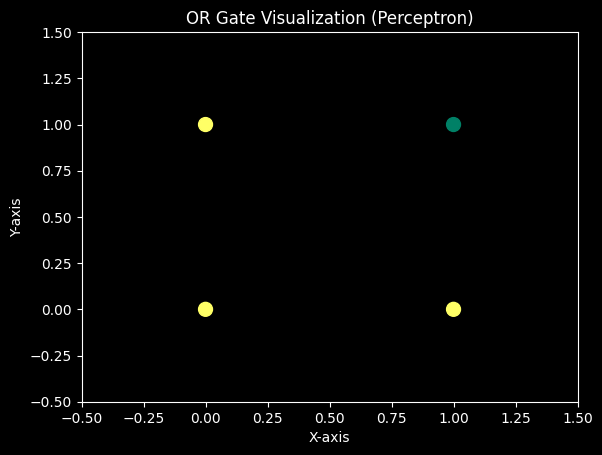

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Enable dark mode for the plot
plt.style.use('dark_background')

# Create the dataset for the AND and OR truth table
data = np.array([[0, 0], [1, 0], [0, 1], [1, 1]])

# Labels: 0 for the first two points, 1 for the last two points (representing gate results)
y = np.array([1, 1, 1, 0])



# Stack the data
X = np.column_stack((data[:, 0], data[:, 1]))

# Plot the points, color them according to the labels (y)
# Use a colormap where 0 corresponds to one color and 1 corresponds to another
plt.scatter(data[:, 0], data[:, 1], c=y, cmap='summer', s=100)

# Extend the axes limits slightly
plt.xlim(-0.5, 1.5)
plt.ylim(-0.5, 1.5)

# Add labels and title
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('OR Gate Visualization (Perceptron)')

# Show the plot
plt.show()


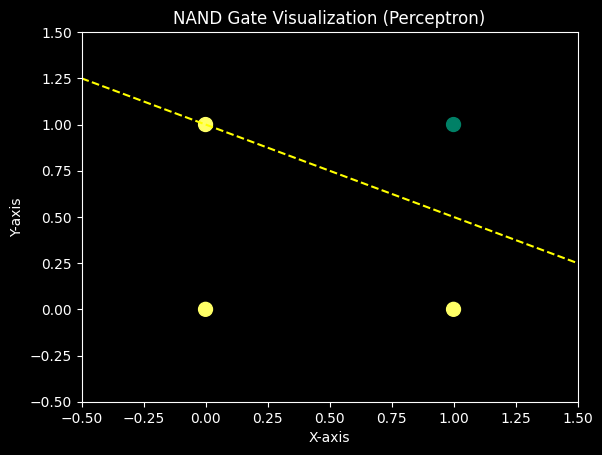

In [ ]:


import matplotlib.pyplot as plt
import numpy as np

# Train the perceptron
weights, bias = perceptron_train(X, y,learning_rate=0.000000000000151233,epochs=30)
# print(weights, bias,bias>0)
# weights=[10,0]
# bias=0
# Plot the points, color them according to the labels (y)
# Use a colormap where 0 corresponds to one color and 1 corresponds to another
plt.scatter(data[:, 0], data[:, 1], c=y, cmap='summer', s=100)

# Extend the axes limits slightly
plt.xlim(-0.5, 1.5)
plt.ylim(-0.5, 1.5)


# Create the decision boundary: w0 * x + w1 * y + b = 0
x_values = np.linspace(-0.5, 1.5, 100)  # x range for decision boundary
decision_boundary = -(weights[0] * x_values + bias) / weights[1]

# Plot the decision boundary
plt.plot(x_values, decision_boundary, color='yellow', label='Decision Boundary',linestyle='--')


# Add labels and title
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('NAND Gate Visualization (Perceptron)')

# Show the plot
plt.show()


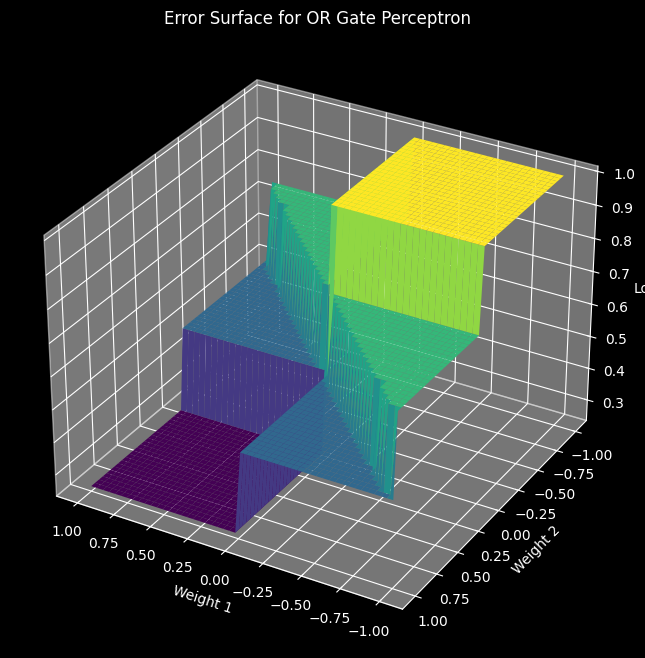

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# OR gate dataset
data = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
labels = np.array([0, 1, 1, 1])  # OR outputs



# Define the loss function (mean squared error)
def loss_function(weights, bias, X, y):
    predictions = np.dot(X, weights) + bias
    predictions = np.where(predictions >= 0, 1, 0)
    return np.mean((predictions - y) ** 2)

# Generate a grid of weights
w1_range = np.linspace(-1, 1, 50)  # Range for first weight
w2_range = np.linspace(-1, 1, 50)  # Range for second weight
W1, W2 = np.meshgrid(w1_range, w2_range)

# Store loss values
loss_values = np.zeros(W1.shape)

# Calculate loss for each combination of weights
for i in range(W1.shape[0]):
    for j in range(W1.shape[1]):
        weights = np.array([W1[i, j], W2[i, j]])  # Weight vector
        bias = 0  # Assuming bias as zero for the loss surface
        loss_values[i, j] = loss_function(weights, bias, data, labels)

# Plotting the loss surface
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(W1, W2, loss_values, cmap='viridis', edgecolor='none')
ax.set_xlabel('Weight 1')
ax.set_ylabel('Weight 2')
ax.set_zlabel('Loss')
ax.set_title('Error Surface for OR Gate Perceptron')
# Change the camera angle
ax.view_init(elev=30, azim=120)  # Adjust elevation and azimuthal angle

plt.show()


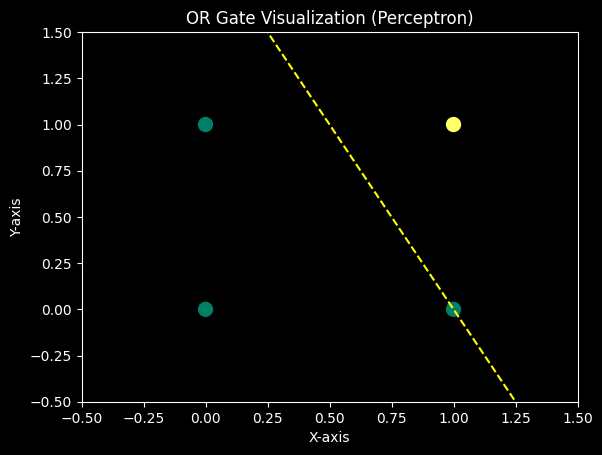

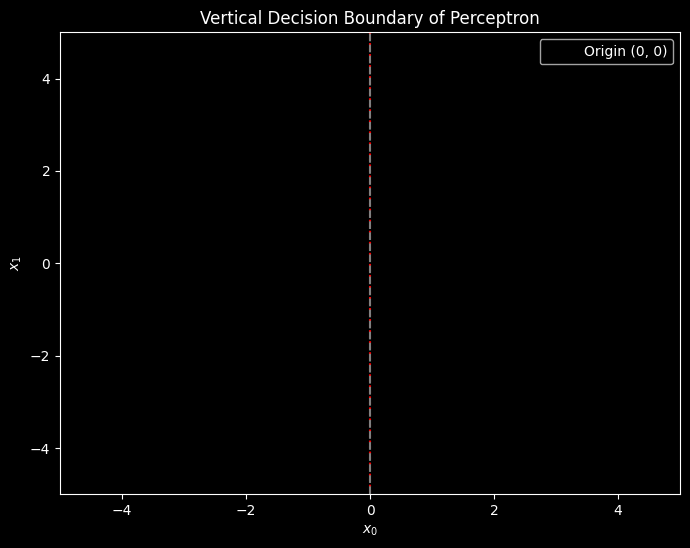

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the weight vector for a vertical decision boundary
w = np.array([1, 0])  # w_0 = 1, w_1 = 0

# Create a grid of points
x0_range = np.linspace(-5, 5, 100)  # Range for x_0
x1_range = np.linspace(-5, 5, 100)  # Range for x_1
x0, x1 = np.meshgrid(x0_range, x1_range)

# Calculate g(x) for the grid points
g = w[0] * x0 + w[1] * x1  # g(x) = w^T x

# Create the plot
plt.figure(figsize=(8, 6))
plt.contour(x0, x1, g, levels=[0], colors='red', linestyles='dotted')  # Dotted decision boundary
plt.axvline(x=0, color='gray', linestyle='--')  # Vertical line at x = 0
plt.xlim(-5, 5)
plt.ylim(-5, 5)
plt.title('Vertical Decision Boundary of Perceptron')
plt.xlabel('$x_0$')
plt.ylabel('$x_1$')
plt.scatter(0, 0, color='black', label='Origin (0, 0)')
plt.legend()
plt.show()


In [ ]:
w = -1*np.array([1, 0])
x = np.array([.3, -.1])
np.dot(w, x)

-0.3

In [ ]:
x = np.array([-.7, .2])
np.dot(w, x)

0.7

# wk 2

*linear seperability*

In [ ]:
import numpy as np

def generate_data_points(N, d):
    # Generate N random data points in d-dimensional space
    data_points = np.random.randn(N, d)

    y = np.array([1] * (N // 2) + [-1] * (N - N // 2))
    return sorted(data_points),y

# Example usage
N = 5  # Number of data points
d = 1  # Dimension of each data point
data,y = generate_data_points(N, d)

print("Generated data points:")
print(data)
print(y)

Generated data points:
[array([-0.9562147]), array([-0.14576332]), array([-0.12707267]), array([-0.0712698]), array([0.05725047])]
[ 1  1 -1 -1 -1]


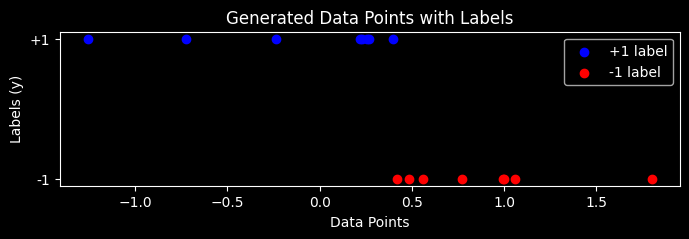

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def generate_data_points(N, d):
    # Generate N random data points in d-dimensional space
    data_points = np.random.randn(N, d)

    y = np.array([1] * (N // 2) + [-1] * (N - N // 2))
    return sorted(data_points), y

# Example usage
N = 16  # Number of data points
d = 1  # Dimension of each data point
data, y = generate_data_points(N, d)

# Convert data to a numpy array for easier plotting
plot_data = np.array(data).flatten()
plt.style.use('dark_background')
# Plot the data
plt.figure(figsize=(8, 2))

# Separate points based on their labels
plt.scatter(plot_data[y == 1], [1]*sum(y == 1), color='blue', label='+1 label')
plt.scatter(plot_data[y == -1], [-1]*sum(y == -1), color='red', label='-1 label')

# Add labels and legend
plt.axhline(0, color='black',linewidth=0.5)
plt.yticks([-1, 1], ['-1', '+1'])
plt.title('Generated Data Points with Labels')
plt.xlabel('Data Points')
plt.ylabel('Labels (y)')
plt.legend()

# Show the plot
plt.show()


In [ ]:
# data = np.array(data)  # Convert to numpy array

# # Reshape the data to be 2D (N x 1) for perceptron
# X = data.reshape(-1, 1)
# weights, bias = perceptron_train(X, y,learning_rate=0.4,epochs=3000)
# print(weights, bias)


# # Plot the data points and the decision boundary
# plt.figure(figsize=(8, 6))

# # Scatter plot for the data points
# plt.scatter(X.flatten(), y, color='blue', label='Data Points')

# # Create a line for the decision boundary
# # Decision boundary occurs when the activation is zero, i.e., X * weights + bias = 0
# decision_boundary_x = np.linspace(min(X), max(X), 100)
# decision_boundary_y = -(weights[0] * decision_boundary_x + bias)  # Solve for y = 0

# # Plot the decision boundary as a vertical line in 1D
# plt.axvline(-bias / weights[0], color='red', label='Decision Boundary')

# plt.title('Decision Boundary for Perceptron')
# plt.xlabel('X (Feature)')
# plt.ylabel('y (Label)')
# plt.legend()

# # Show the plot
# plt.show()


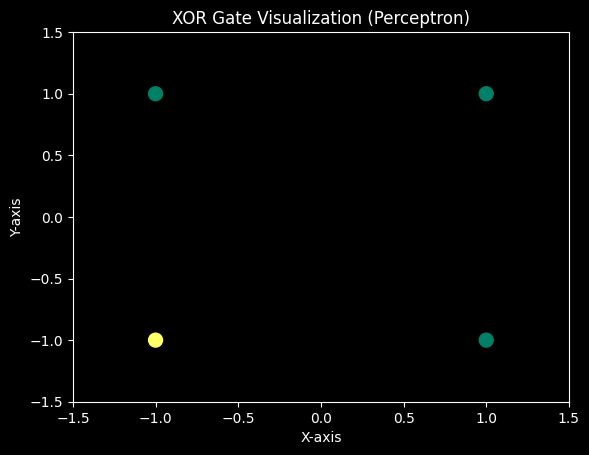

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Enable dark mode for the plot
plt.style.use('dark_background')

# Create the dataset for the XOR truth table
data = np.array([[-1, -1], [-1, 1], [1, -1], [1, 1]])

# Labels: 0 for the first two points, 1 for the last two points (representing XOR results)
y = np.array([1, 0, 0, 0])  # XOR outputs

# Stack the data
X = np.column_stack((data[:, 0], data[:, 1]))

# Plot the points, color them according to the labels (y)
# Use a colormap where 0 corresponds to one color and 1 corresponds to another
plt.scatter(data[:, 0], data[:, 1], c=y, cmap='summer', s=100)

# Extend the axes limits slightly
plt.xlim(-1.5, 1.5)
plt.ylim(-1.5, 1.5)

# Add labels and title
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('XOR Gate Visualization (Perceptron)')

# Show the plot
plt.show()


In [ ]:
X,y

(array([[-1, -1],
        [-1,  1],
        [ 1, -1],
        [ 1,  1]]),
 array([1, 0, 0, 0]))

## MLP

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# Updated activation function (sigmoid)
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    return x * (1 - x)


# Activation function (step function)
def step_function(x):
    return 1 if x >= 0 else 0

class MultiLayerPerceptron:
    def __init__(self, input_size, hidden_size, output_size):
        # Initialize weights and biases
        self.weights_hidden = np.random.rand(hidden_size, input_size)  # Weights for hidden layer
        self.bias_hidden = np.random.rand(hidden_size)  # Biases for hidden layer
        self.weights_output = np.random.rand(output_size, hidden_size)  # Weights for output layer
        self.bias_output = np.random.rand(output_size)  # Biases for output layer

    def train(self, X, y, learning_rate=0.1, epochs=10000):  # Increased epochs for better learning
        for epoch in range(epochs):
            for i in range(len(X)):
                # Forward pass through hidden layer
                hidden_layer_input = np.dot(X[i], self.weights_hidden.T) + self.bias_hidden
                hidden_layer_output = sigmoid(hidden_layer_input)

                # Forward pass through output layer
                activation_output = np.dot(hidden_layer_output, self.weights_output.T) + self.bias_output
                prediction = sigmoid(activation_output)

                # Backpropagation
                output_error = y[i] - prediction
                d_output = output_error * sigmoid_derivative(prediction)

                # Update output layer weights and biases
                self.weights_output += learning_rate * d_output * hidden_layer_output.reshape(-1, 1).T
                self.bias_output += learning_rate * d_output

                # Update hidden layer weights and biases
                hidden_errors = d_output.dot(self.weights_output) * sigmoid_derivative(hidden_layer_output)
                self.weights_hidden += learning_rate * hidden_errors.reshape(-1, 1) * X[i]
                self.bias_hidden += learning_rate * hidden_errors

    def visualize_weights_and_biases(self):
        plt.figure(figsize=(12, 6))

        # Weights and biases for hidden layer
        plt.subplot(1, 2, 1)
        plt.title("Hidden Layer Weights")
        plt.imshow(self.weights_hidden, cmap='viridis', aspect='auto')
        plt.colorbar()
        plt.xticks(np.arange(self.weights_hidden.shape[1]), ['Input 1', 'Input 2'])
        plt.yticks(np.arange(self.weights_hidden.shape[0]), [f'Neuron {i+1}' for i in range(self.weights_hidden.shape[0])])

        # Biases for hidden layer
        plt.subplot(1, 2, 2)
        plt.title("Hidden Layer Biases")
        plt.bar(range(len(self.bias_hidden)), self.bias_hidden, color='skyblue')
        plt.xticks(range(len(self.bias_hidden)), [f'Neuron {i+1}' for i in range(len(self.bias_hidden))])

        plt.show()

    def visualize_structure(self):
        plt.figure(figsize=(8, 6))
        layer_sizes = [2, self.weights_hidden.shape[0], self.weights_output.shape[0]]  # Input, hidden, and output layer sizes
        colors = ['lightblue', 'lightgreen', 'lightcoral']

        # Calculate the position of each neuron
        neuron_positions = []
        for i, size in enumerate(layer_sizes):
            x = np.full(size, i)
            y = np.linspace(-0.5, size - 0.5, size)
            neuron_positions.append(np.column_stack((x, y)))

        # Plot neurons
        for layer_index, neurons in enumerate(neuron_positions):
            plt.scatter(neurons[:, 0], neurons[:, 1], s=500, color=colors[layer_index], edgecolors='black', zorder=5)
            for i, (x, y) in enumerate(neurons):
                plt.text(x, y, f'N{i+1}' if layer_index != len(layer_sizes) - 1 else 'Output', ha='center', va='center', fontsize=12)

        # Draw connections
        for l in range(len(layer_sizes) - 1):
            for n1 in range(layer_sizes[l]):
                for n2 in range(layer_sizes[l + 1]):
                    plt.plot([neuron_positions[l][n1][0], neuron_positions[l + 1][n2][0]],
                             [neuron_positions[l][n1][1], neuron_positions[l + 1][n2][1]],
                             color='gray', zorder=2)

        plt.title('Multi-Layer Perceptron Structure', fontsize=14)
        plt.xlim(-0.5, len(layer_sizes) - 0.5)
        plt.ylim(-1, max(layer_sizes) + 1)
        plt.axis('off')  # Turn off the axis
        plt.show()



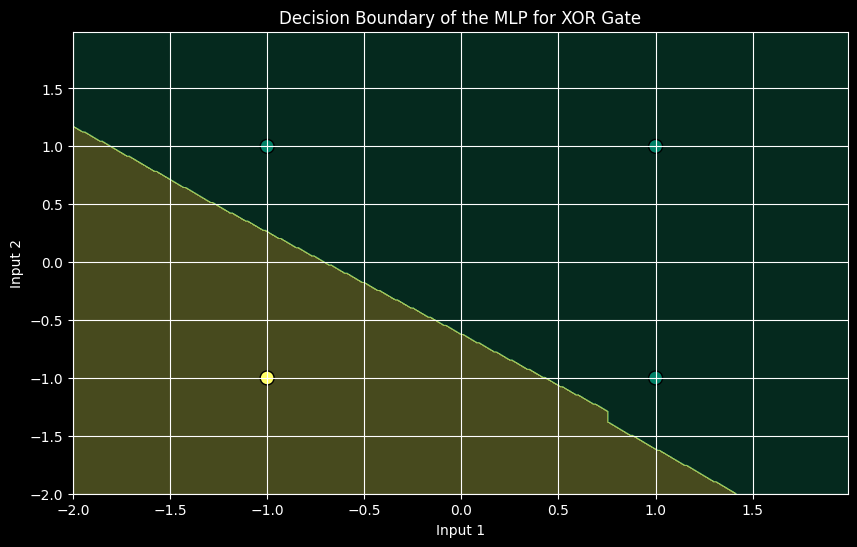

In [ ]:
# Plotting the decision boundary
def plot_decision_boundary(mlp, X, y):
    # Create a grid of points
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))

    # Flatten the grid to pass into the MLP
    grid_points = np.c_[xx.ravel(), yy.ravel()]

    # Get predictions for each point in the grid
    predictions = []
    for point in grid_points:
        hidden_layer_output = []
        for j in range(mlp.weights_hidden.shape[0]):
            activation = np.dot(point, mlp.weights_hidden[j]) + mlp.bias_hidden[j]
            hidden_layer_output.append(step_function(activation))

        activation_output = np.dot(hidden_layer_output, mlp.weights_output.T) + mlp.bias_output
        predictions.append(step_function(activation_output))

    # Reshape predictions back to the grid shape
    predictions = np.array(predictions).reshape(xx.shape)

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.contourf(xx, yy, predictions, alpha=0.3, cmap='summer')
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', s=100, cmap='summer')
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.xlabel('Input 1')
    plt.ylabel('Input 2')
    plt.title('Decision Boundary of the MLP for XOR Gate')
    plt.grid()
    plt.show()

# Initialize and train the MLP
mlp = MultiLayerPerceptron(input_size=2, hidden_size=4, output_size=1)
mlp.train(X, y, learning_rate=0.84, epochs=10000)

# Plot the decision boundary
plot_decision_boundary(mlp, X, y)



In [ ]:
temp=mlp.bias_output

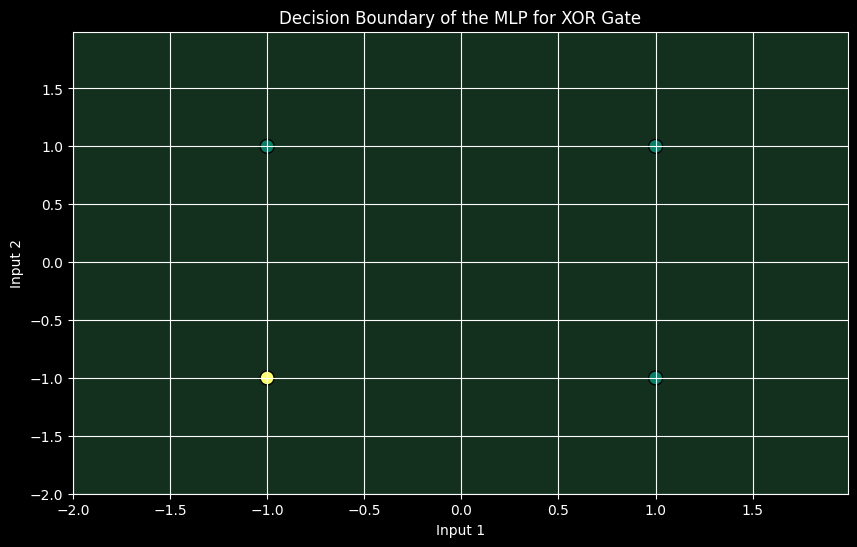

In [ ]:
mlp.bias_output=-200

# Plot the decision boundary
plot_decision_boundary(mlp, X, y)

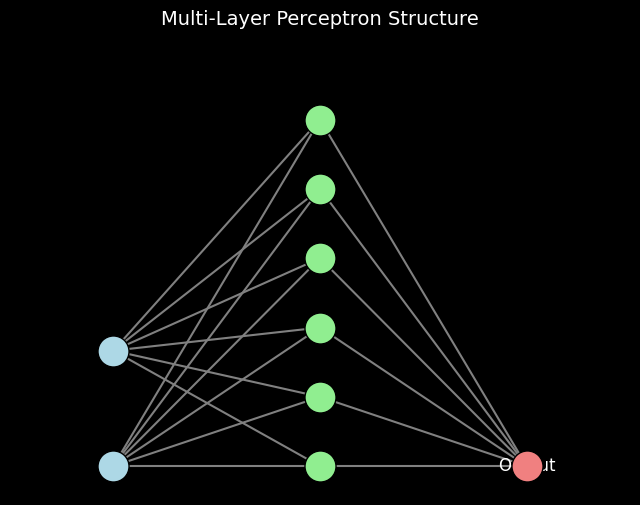

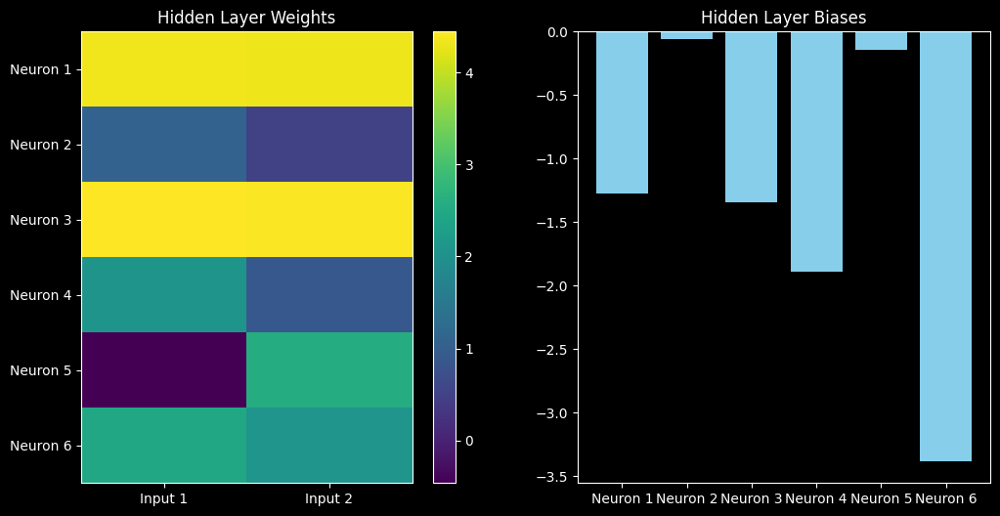

In [ ]:
# Visualize the MLP structure before training
mlp.visualize_structure()

# Visualize initial weights and biases
mlp.visualize_weights_and_biases()



In [ ]:
# \frac{1}{1+e^{-(wx+b)}}

In [ ]:
import numpy as np

def sigmoid(x):
    w = 20
    wx = w * x  # Compute wx
    b = 1       # Bias
    return 1 / (1 + np.exp(-(wx + b)))  # Sigmoid function

# Actual target values
target_values = np.array([0.4, 0.95])

# Input values
input_values = np.array([0.06, 0.4])

# Predictions from the sigmoid function
predicted_values = sigmoid(input_values)

# Mean Squared Error computation
mse = np.mean((predicted_values - target_values) ** 2)

print("Predicted values:", predicted_values)
print("Mean Squared Error:", mse)


Predicted values: [0.90024951 0.99987661]
Mean Squared Error: 0.12636862445230845


In [ ]:
import numpy as np

def ssigmoid(x,w,b):

    return 1 / (1 + np.exp(-(w*x + b)))  # Sigmoid function


X = np.array([-1,0.2])
y = np.array([0.5,0.97])

w =2
b=2

In [ ]:
import numpy as np

def sigmoid(x, w, b):
    """Compute the sigmoid function."""
    return 1 / (1 + np.exp(-(w * x + b)))  # Sigmoid function

def compute_mse(y_true, y_pred):
    """Compute the mean squared error."""
    return (y_pred - y_true) ** 2

# Input and target values
X = np.array([-1, 0.2])
y = np.array([0.5, 0.97])

# Initial weights and bias
w = 2
b = 2

# Learning rate
learning_rate = 2

# Run gradient descent for 3 iterations
for iteration in range(3):
    # Compute predicted values
    y_pred = sigmoid(X, w, b)

    # Compute gradients
    error = y_pred - y  # Difference between predictions and actual values
    mse = compute_mse(y, y_pred)  # Compute MSE

    # Gradients for w and b
    gradient_w = (1 / len(y)) * np.sum(error * y_pred * (1 - y_pred) * X)  # dMSE/dw
    gradient_b = (1 / len(y)) * np.sum(error * y_pred * (1 - y_pred))  # dMSE/db

    # Update weights and bias
    w -= learning_rate * gradient_w
    b -= learning_rate * gradient_b

    # Print updated values
    print(f"Iteration {iteration + 1}: Updated w = {w:.4f}, Updated b = {b:.4f},")


Iteration 1: Updated w = 2.0008, Updated b = 2.0041,
Iteration 2: Updated w = 2.0018, Updated b = 2.0079,
Iteration 3: Updated w = 2.0030, Updated b = 2.0115,


In [ ]:
ssigmoid(-1,2.39,2.31)

0.48001065984441826

In [ ]:
ssigmoid(-1,2.39,0.39)

0.11920292202211755

In [ ]:
ssigmoid(-1,-2.39,0.39)

0.9415854444576037

In [ ]:
# week 3

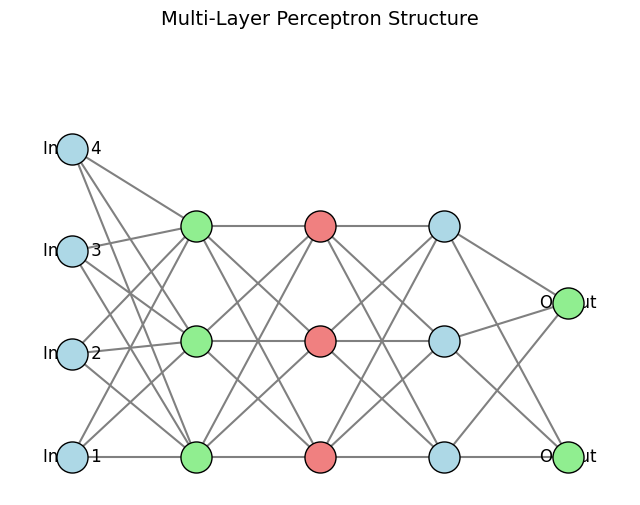

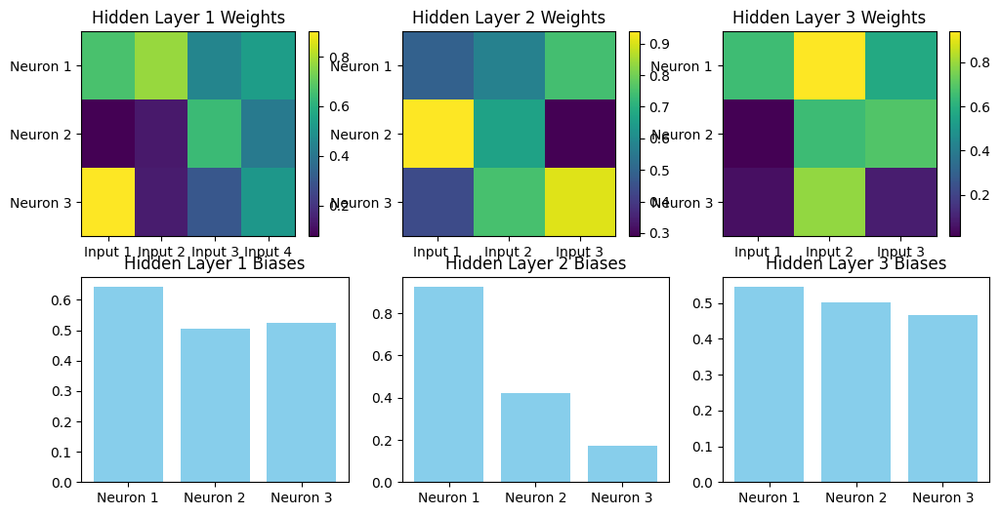

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Updated activation function (sigmoid)
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    return x * (1 - x)

class MultiLayerPerceptron:
    def __init__(self, input_size, hidden_layer_size, num_hidden_layers, output_size):
        """
        :param input_size: Number of inputs
        :param hidden_layer_size: Number of neurons in each hidden layer
        :param num_hidden_layers: Number of hidden layers
        :param output_size: Number of output neurons
        """
        self.input_size = input_size
        self.output_size = output_size
        self.num_hidden_layers = num_hidden_layers
        self.hidden_layer_size = hidden_layer_size

        # Initialize weights and biases for each layer
        self.weights = []
        self.biases = []

        # Weights and biases for input to first hidden layer
        self.weights.append(np.random.rand(hidden_layer_size, input_size))
        self.biases.append(np.random.rand(hidden_layer_size))

        # Weights and biases for hidden layers
        for _ in range(1, num_hidden_layers):
            self.weights.append(np.random.rand(hidden_layer_size, hidden_layer_size))
            self.biases.append(np.random.rand(hidden_layer_size))

        # Weights and biases for last hidden layer to output layer
        self.weights.append(np.random.rand(output_size, hidden_layer_size))
        self.biases.append(np.random.rand(output_size))

    def train(self, X, y, learning_rate=0.1, epochs=10000):
        for epoch in range(epochs):
            for i in range(len(X)):
                # Forward pass through hidden layers
                activations = [X[i]]  # Store activations of each layer (including input)
                for layer in range(self.num_hidden_layers):
                    input_to_layer = np.dot(activations[-1], self.weights[layer].T) + self.biases[layer]
                    activations.append(sigmoid(input_to_layer))

                # Forward pass through output layer
                activation_output = np.dot(activations[-1], self.weights[-1].T) + self.biases[-1]
                prediction = sigmoid(activation_output)

                # Backpropagation
                output_error = y[i] - prediction
                d_output = output_error * sigmoid_derivative(prediction)

                # Update output layer weights and biases
                self.weights[-1] += learning_rate * d_output * activations[-1].reshape(-1, 1).T
                self.biases[-1] += learning_rate * d_output

                # Backpropagate through hidden layers
                errors = [d_output.dot(self.weights[-1])]  # Start with the error of the output layer
                for layer in reversed(range(self.num_hidden_layers)):
                    d_hidden = errors[-1] * sigmoid_derivative(activations[layer + 1])
                    self.weights[layer] += learning_rate * d_hidden.reshape(-1, 1) * activations[layer]
                    self.biases[layer] += learning_rate * d_hidden
                    if layer > 0:
                        errors.append(d_hidden.dot(self.weights[layer]))

    def visualize_weights_and_biases(self):
        plt.figure(figsize=(12, 6))

        # Weights and biases for hidden layers
        for layer in range(self.num_hidden_layers):
            plt.subplot(2, self.num_hidden_layers, layer + 1)
            plt.title(f"Hidden Layer {layer + 1} Weights")
            plt.imshow(self.weights[layer], cmap='viridis', aspect='auto')
            plt.colorbar()
            plt.xticks(np.arange(self.weights[layer].shape[1]), [f'Input {i + 1}' for i in range(self.weights[layer].shape[1])])
            plt.yticks(np.arange(self.weights[layer].shape[0]), [f'Neuron {i + 1}' for i in range(self.weights[layer].shape[0])])

            plt.subplot(2, self.num_hidden_layers, layer + 1 + self.num_hidden_layers)
            plt.title(f"Hidden Layer {layer + 1} Biases")
            plt.bar(range(len(self.biases[layer])), self.biases[layer], color='skyblue')
            plt.xticks(range(len(self.biases[layer])), [f'Neuron {i + 1}' for i in range(len(self.biases[layer]))])

        plt.show()

    def visualize_structure(self):
        plt.figure(figsize=(8, 6))

        # Dynamically set input, hidden, and output layer sizes
        layer_sizes = [self.input_size] + [self.hidden_layer_size] * self.num_hidden_layers + [self.output_size]
        colors = ['lightblue', 'lightgreen', 'lightcoral']

        # Calculate the position of each neuron
        neuron_positions = []
        for i, size in enumerate(layer_sizes):
            x = np.full(size, i)
            y = np.linspace(-0.5, size - 0.5, size)
            neuron_positions.append(np.column_stack((x, y)))

        # Plot neurons
        for layer_index, neurons in enumerate(neuron_positions):
            plt.scatter(neurons[:, 0], neurons[:, 1], s=500, color=colors[layer_index % len(colors)], edgecolors='black', zorder=5)
            for i, (x, y) in enumerate(neurons):
                if layer_index == 0:  # Input layer
                    plt.text(x, y, f'Input {i+1}', ha='center', va='center', fontsize=12)
                elif layer_index == len(layer_sizes) - 1:  # Output layer
                    plt.text(x, y, 'Output', ha='center', va='center', fontsize=12)
                else:  # Hidden layers
                    plt.text(x, y, f'N{i+1}', ha='center', va='center', fontsize=12)

        # Draw connections
        for l in range(len(layer_sizes) - 1):
            for n1 in range(layer_sizes[l]):
                for n2 in range(layer_sizes[l + 1]):
                    plt.plot([neuron_positions[l][n1][0], neuron_positions[l + 1][n2][0]],
                             [neuron_positions[l][n1][1], neuron_positions[l + 1][n2][1]],
                             color='gray', zorder=2)

        plt.title('Multi-Layer Perceptron Structure', fontsize=14)
        plt.xlim(-0.5, len(layer_sizes) - 0.5)
        plt.ylim(-1, max(layer_sizes) + 1)
        plt.axis('off')  # Turn off the axis
        plt.show()

# Example of using the updated MultiLayerPerceptron class
mlp = MultiLayerPerceptron(input_size=4, hidden_layer_size=3, num_hidden_layers=3, output_size=2)

# Visualize the MLP structure before training
mlp.visualize_structure()

# Visualize initial weights and biases
mlp.visualize_weights_and_biases()


In [ ]:
files = np.load('parameters.npz')


# Assuming W1, W2, W3 and corresponding biases b1, b2, b3 are present in the .npz file
W1 = files['W1']  # 3x3 weight matrix for first hidden layer
W2 = files['W2']  # 3x3 weight matrix for second hidden layer
W3 = files['W3']  # 3x3 weight matrix for output layer

# Optionally, if the biases are also saved
b1 = files.get('b1' )  # Biases for first hidden layer, default to zeros if not available
b2 = files.get('b2', np.zeros(3))  # Biases for second hidden layer
b3 = files.get('b3', np.zeros(3))  # Biases for output layer


In [ ]:
W1

array([[0.5488135 , 0.71518937, 0.60276338],
       [0.54488318, 0.4236548 , 0.64589411],
       [0.43758721, 0.891773  , 0.96366276]])

In [ ]:
b1

array([[0.38344152],
       [0.79172504],
       [0.52889492]])

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.losses import CategoricalCrossentropy

# Define the neural network model
def create_model():
    model = Sequential()

    # Input Layer (implicitly created when defining the first hidden layer)
    # First hidden layer with 3 neurons and Sigmoid activation
    model.add(Dense(3, input_shape=(3,), activation='sigmoid', name="Hidden_Layer_1"))

    # Second hidden layer with 3 neurons and Sigmoid activation
    model.add(Dense(3, activation='sigmoid', name="Hidden_Layer_2"))

    # Output layer with 3 neurons and Softmax activation
    model.add(Dense(3, activation='softmax', name="Output_Layer"))

    # Compile the model using Categorical Crossentropy loss and an optimizer (e.g., Adam)
    model.compile(optimizer='adam',
                  loss=CategoricalCrossentropy(),
                  metrics=['accuracy'])

    return model

# Create the model
model = create_model()

# Display the model architecture
model.summary()


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ Hidden_Layer_1 (Dense)               │ (None, 3)                   │              12 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Hidden_Layer_2 (Dense)               │ (None, 3)                   │              12 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Output_Layer (Dense)                 │ (None, 3)                   │              12 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 36 (144.00 B)

 Trainable params: 36 (144.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# For the first hidden layer (weights and biases)
model.layers[0].set_weights([W1.T, b1.flatten()])  # Note: TensorFlow expects weights in shape (input_dim, output_dim)
                                         # Therefore, we transpose W1 (from 3x3 to 3x3)

# For the second hidden layer (weights and biases)
model.layers[1].set_weights([W2.T, b2.flatten()])

# For the output layer (weights and biases)
model.layers[2].set_weights([W3.T, b3.flatten()])

In [ ]:
x = np.array([[1], [0], [1]])  # Example input, can replace with any 3D input vector

# Get output from the model
output = model.predict(x.T)

output # Transpose x to match the input shape expected by the model




1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


array([[0.23691422, 0.3383885 , 0.42469734]], dtype=float32)

In [ ]:
true_labels = np.array([[0, 0, 1]])  # Modify according to your true class

# Create a CategoricalCrossentropy loss function with from_logits=True
loss_fn = tf.keras.losses.CategoricalCrossentropy(from_logits=False)

# Calculate the loss
loss_value = loss_fn(true_labels, output)

In [ ]:
loss_value.numpy()

0.8563785

In [ ]:
with tf.GradientTape() as tape:
    # Forward pass
    predictions = model(x.T)  # Transpose x to match input shape
    loss_value = loss_fn(true_labels, predictions)
# Calculate the gradients of the loss with respect to the model parameters
gradients = tape.gradient(loss_value, model.trainable_variables)


In [ ]:
gradients[3]

<tf.Tensor: shape=(3,), dtype=float32, numpy=array([ 0.01838198, -0.01997644, -0.0038401 ], dtype=float32)>

In [ ]:
learning_rate = 1
# Update parameters (weights and biases)
for i, variable in enumerate(model.trainable_variables):
    variable.assign_sub(learning_rate * gradients[i])  # Update the variable using gradient descent


In [ ]:
# Perform another forward pass with updated weights and biases
new_predictions = model(x.T)
new_loss_value = loss_fn(true_labels, new_predictions)
new_loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.07253338>

In [ ]:
!pip install pygraphviz


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.0/106.0 kB 7.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  error: subprocess-exited-with-error
  
  × Building wheel for pygraphviz (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for pygraphviz
Failed to build pygraphviz
ERROR: ERROR: Failed to build installable wheels for some pyproject.toml based projects (pygraphviz)


In [ ]:
from pycfg import pycfg, CFGNode, Visualize

cfg = pycfg()
cfg.gen_cfg("""x = 0
y = 1
while x < y:
    y = x + y
    x = x + 1
""")
Visualize(cfg)

ModuleNotFoundError: No module named 'pygraphviz'

In [ ]:
# week 4

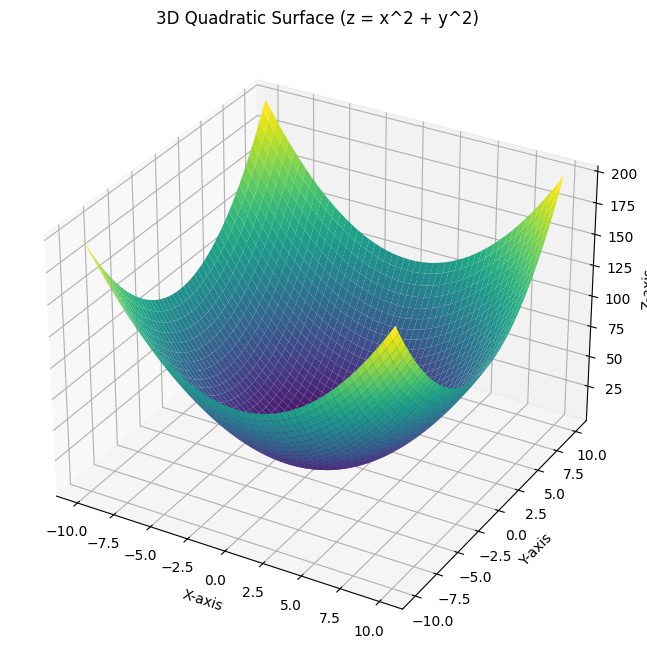

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create data for a quadratic surface
x = np.linspace(-10, 10, 400)
y = np.linspace(-10, 10, 400)
x, y = np.meshgrid(x, y)
z = x**2 + y**2

# Create the 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(x, y, z, cmap='viridis')

# Set labels and title
ax.set_title('3D Quadratic Surface (z = x^2 + y^2)')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')

plt.show()


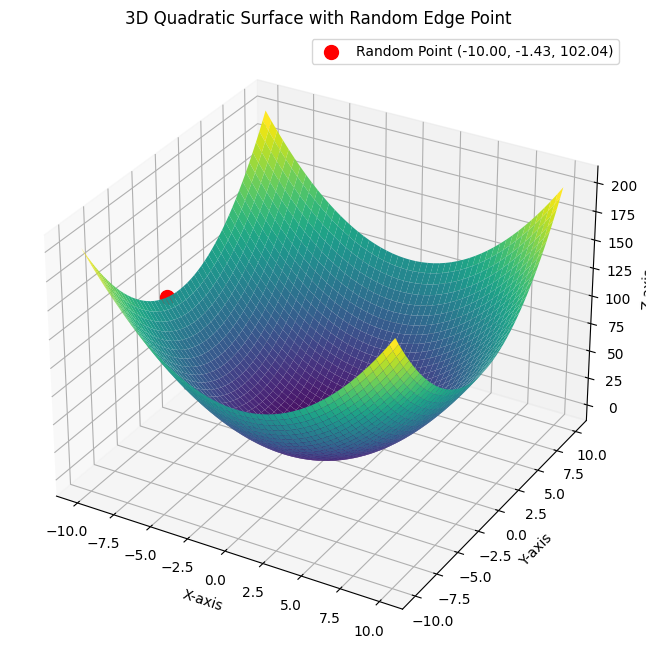

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create data for a quadratic surface
x = np.linspace(-10, 10, 400)
y = np.linspace(-10, 10, 400)
x, y = np.meshgrid(x, y)
z = x**2 + y**2

# Select a random edge point (either from first or last row/column)
edge_points = np.concatenate([z[0, :], z[-1, :], z[:, 0], z[:, -1]])
random_idx = np.random.randint(0, len(edge_points))

if random_idx < len(z[0, :]):
    random_x, random_y, random_z = x[0, random_idx], y[0, random_idx], z[0, random_idx]
elif random_idx < len(z[0, :]) + len(z[-1, :]):
    idx = random_idx - len(z[0, :])
    random_x, random_y, random_z = x[-1, idx], y[-1, idx], z[-1, idx]
elif random_idx < len(z[0, :]) + len(z[-1, :]) + len(z[:, 0]):
    idx = random_idx - len(z[0, :]) - len(z[-1, :])
    random_x, random_y, random_z = x[idx, 0], y[idx, 0], z[idx, 0]
else:
    idx = random_idx - len(z[0, :]) - len(z[-1, :]) - len(z[:, 0])
    random_x, random_y, random_z = x[idx, -1], y[idx, -1], z[idx, -1]

# Plot the surface and the selected point
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, z, cmap='viridis')

# Highlight the random edge point
ax.scatter(random_x, random_y, random_z, color='red', s=100, label=f"Random Point ({random_x:.2f}, {random_y:.2f}, {random_z:.2f})")
ax.legend()

# Set labels and title
ax.set_title('3D Quadratic Surface with Random Edge Point')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')

plt.show()


In [ ]:
import numpy as np
import plotly.graph_objects as go

# Create data for a quadratic surface
x_vals = np.linspace(-10, 10, 400)
y_vals = np.linspace(-10, 10, 400)
x_vals, y_vals = np.meshgrid(x_vals, y_vals)
z_vals = x_vals**2 + y_vals**2

# Select a random edge point (either from first or last row/column)
edge_points = np.concatenate([z_vals[0, :], z_vals[-1, :], z_vals[:, 0], z_vals[:, -1]])
random_idx = np.random.randint(0, len(edge_points))

if random_idx < len(z_vals[0, :]):
    random_x, random_y, random_z = x_vals[0, random_idx], y_vals[0, random_idx], z_vals[0, random_idx]
elif random_idx < len(z_vals[0, :]) + len(z_vals[-1, :]):
    idx = random_idx - len(z_vals[0, :])
    random_x, random_y, random_z = x_vals[-1, idx], y_vals[-1, idx], z_vals[-1, idx]
elif random_idx < len(z_vals[0, :]) + len(z_vals[-1, :]) + len(z_vals[:, 0]):
    idx = random_idx - len(z_vals[0, :]) - len(z_vals[-1, :])
    random_x, random_y, random_z = x_vals[idx, 0], y_vals[idx, 0], z_vals[idx, 0]
else:
    idx = random_idx - len(z_vals[0, :]) - len(z_vals[-1, :]) - len(z_vals[:, 0])
    random_x, random_y, random_z = x_vals[idx, -1], y_vals[idx, -1], z_vals[idx, -1]

# Gradient descent parameters
learning_rate = 0.007
iterations = 15
gd_points = [(random_x, random_y, random_z)]

agd_points = [(random_x, random_y, random_z)]


# Initialize velocity and momentum
v_x, v_y = 0, 0
momentum = 0.9

random_ax =random_x
random_ay =random_y
random_az = random_x**2 + random_y**2

# Perform 2 iterations of gradient descent
for _ in range(iterations):
    grad_x = 2 * random_x
    grad_y = 2 * random_y

    # Update x and y by stepping in the opposite direction of the gradient
    random_x -= learning_rate * grad_x
    random_y -= learning_rate * grad_y
    random_z = random_x**2 + random_y**2

    gd_points.append((random_x, random_y, random_z))

    agrad_x = 2 * random_ax
    agrad_y = 2 * random_ay


        # Update velocities with momentum
    v_x = momentum * v_x - learning_rate * agrad_x
    v_y = momentum * v_y - learning_rate * agrad_y

    # Update positions
    random_ax += v_x
    random_ay += v_y
    random_az = random_ax**2 + random_ay**2

    agd_points.append((random_ax, random_ay, random_az))


# Create a 3D surface plot using Plotly
surface = go.Surface(z=z_vals, x=x_vals, y=y_vals, colorscale='Viridis',showscale=False)

# Plot the initial random point and gradient descent points
points = go.Scatter3d(
    x=[p[0] for p in gd_points],
    y=[p[1] for p in gd_points],
    z=[p[2] for p in gd_points],
    mode='markers+lines',
    marker=dict(size=5, color='red'),
    line=dict(color='red', width=3),
    name="Gradient Descent Path"
)

apoints = go.Scatter3d(
    x=[p[0] for p in agd_points],
    y=[p[1] for p in agd_points],
    z=[p[2] for p in agd_points],
    mode='markers+lines',
    marker=dict(size=5, color='cyan'),
    line=dict(color='cyan', width=3),
    name="accelerated Gradient Descent Path"
)


# Combine the surface and points into a figure
fig = go.Figure(data=[surface, points,apoints])

# Set titles and camera view
fig.update_layout(
    title="3D Quadratic Surface with Gradient Descent Path",
    scene=dict(
        xaxis_title='X-axis',
        yaxis_title='Y-axis',
        zaxis_title='Z-axis',
        camera_eye=dict(x=1.5, y=1.5, z=1.5)  # Adjust camera view
    )
)

# Show the plot
fig.show()


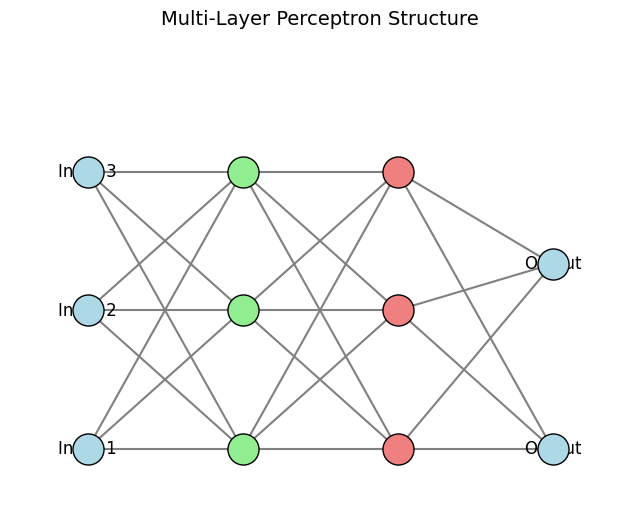

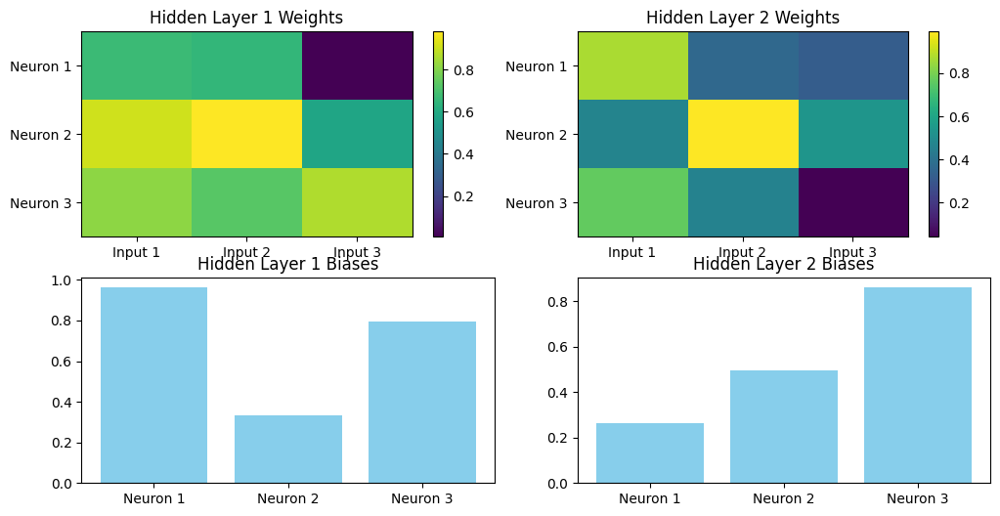

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Updated activation function (sigmoid)
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    return x * (1 - x)

class MultiLayerPerceptron:
    def __init__(self, input_size, hidden_layer_size, num_hidden_layers, output_size):
        """
        :param input_size: Number of inputs
        :param hidden_layer_size: Number of neurons in each hidden layer
        :param num_hidden_layers: Number of hidden layers
        :param output_size: Number of output neurons
        """
        self.input_size = input_size
        self.output_size = output_size
        self.num_hidden_layers = num_hidden_layers
        self.hidden_layer_size = hidden_layer_size

        # Initialize weights and biases for each layer
        self.weights = []
        self.biases = []

        # Weights and biases for input to first hidden layer
        self.weights.append(np.random.rand(hidden_layer_size, input_size))
        self.biases.append(np.random.rand(hidden_layer_size))

        # Weights and biases for hidden layers
        for _ in range(1, num_hidden_layers):
            self.weights.append(np.random.rand(hidden_layer_size, hidden_layer_size))
            self.biases.append(np.random.rand(hidden_layer_size))

        # Weights and biases for last hidden layer to output layer
        self.weights.append(np.random.rand(output_size, hidden_layer_size))
        self.biases.append(np.random.rand(output_size))

    def train(self, X, y, learning_rate=0.1, epochs=10000):
        for epoch in range(epochs):
            for i in range(len(X)):
                # Forward pass through hidden layers
                activations = [X[i]]  # Store activations of each layer (including input)
                for layer in range(self.num_hidden_layers):
                    input_to_layer = np.dot(activations[-1], self.weights[layer].T) + self.biases[layer]
                    activations.append(sigmoid(input_to_layer))

                # Forward pass through output layer
                activation_output = np.dot(activations[-1], self.weights[-1].T) + self.biases[-1]
                prediction = sigmoid(activation_output)

                # Backpropagation
                output_error = y[i] - prediction
                d_output = output_error * sigmoid_derivative(prediction)

                # Update output layer weights and biases
                self.weights[-1] += learning_rate * d_output * activations[-1].reshape(-1, 1).T
                self.biases[-1] += learning_rate * d_output

                # Backpropagate through hidden layers
                errors = [d_output.dot(self.weights[-1])]  # Start with the error of the output layer
                for layer in reversed(range(self.num_hidden_layers)):
                    d_hidden = errors[-1] * sigmoid_derivative(activations[layer + 1])
                    self.weights[layer] += learning_rate * d_hidden.reshape(-1, 1) * activations[layer]
                    self.biases[layer] += learning_rate * d_hidden
                    if layer > 0:
                        errors.append(d_hidden.dot(self.weights[layer]))



    def batch_train(self, X, y, learning_rate=0.1, epochs=1000, batch_size=16):
        n_samples = len(X)

        for epoch in range(epochs):
            for batch_start in range(0, n_samples, batch_size):
                batch_end = batch_start + batch_size
                X_batch = X[batch_start:batch_end]
                y_batch = y[batch_start:batch_end]

                # Initialize gradients for weights and biases
                weight_gradients = [np.zeros_like(w) for w in self.weights]
                bias_gradients = [np.zeros_like(b) for b in self.biases]

                # Accumulate gradients over the batch
                for i in range(len(X_batch)):
                    # Forward pass through hidden layers
                    activations = [X_batch[i]]
                    for layer in range(self.num_hidden_layers):
                        input_to_layer = np.dot(activations[-1], self.weights[layer].T) + self.biases[layer]
                        activations.append(sigmoid(input_to_layer))

                    # Forward pass through output layer
                    activation_output = np.dot(activations[-1], self.weights[-1].T) + self.biases[-1]
                    prediction = sigmoid(activation_output)

                    # Backpropagation
                    output_error = y_batch[i] - prediction
                    d_output = output_error * sigmoid_derivative(prediction)

                    # Accumulate gradients for the output layer
                    weight_gradients[-1] += np.outer(d_output, activations[-1])
                    bias_gradients[-1] += d_output

                    # Backpropagate through hidden layers
                    errors = [d_output.dot(self.weights[-1])]
                    for layer in reversed(range(self.num_hidden_layers)):
                        d_hidden = errors[-1] * sigmoid_derivative(activations[layer + 1])
                        weight_gradients[layer] += np.outer(d_hidden, activations[layer])
                        bias_gradients[layer] += d_hidden
                        if layer > 0:
                            errors.append(d_hidden.dot(self.weights[layer]))

                # Update weights and biases after processing the batch
                for layer in range(self.num_hidden_layers + 1):
                    self.weights[layer] += learning_rate * weight_gradients[layer] / batch_size
                    self.biases[layer] += learning_rate * bias_gradients[layer] / batch_size
    def visualize_weights_and_biases(self):
        plt.figure(figsize=(12, 6))

        # Weights and biases for hidden layers
        for layer in range(self.num_hidden_layers):
            plt.subplot(2, self.num_hidden_layers, layer + 1)
            plt.title(f"Hidden Layer {layer + 1} Weights")
            plt.imshow(self.weights[layer], cmap='viridis', aspect='auto')
            plt.colorbar()
            plt.xticks(np.arange(self.weights[layer].shape[1]), [f'Input {i + 1}' for i in range(self.weights[layer].shape[1])])
            plt.yticks(np.arange(self.weights[layer].shape[0]), [f'Neuron {i + 1}' for i in range(self.weights[layer].shape[0])])

            plt.subplot(2, self.num_hidden_layers, layer + 1 + self.num_hidden_layers)
            plt.title(f"Hidden Layer {layer + 1} Biases")
            plt.bar(range(len(self.biases[layer])), self.biases[layer], color='skyblue')
            plt.xticks(range(len(self.biases[layer])), [f'Neuron {i + 1}' for i in range(len(self.biases[layer]))])

        plt.show()

    def visualize_structure(self):
        plt.figure(figsize=(8, 6))

        # Dynamically set input, hidden, and output layer sizes
        layer_sizes = [self.input_size] + [self.hidden_layer_size] * self.num_hidden_layers + [self.output_size]
        colors = ['lightblue', 'lightgreen', 'lightcoral']

        # Calculate the position of each neuron
        neuron_positions = []
        for i, size in enumerate(layer_sizes):
            x = np.full(size, i)
            y = np.linspace(-0.5, size - 0.5, size)
            neuron_positions.append(np.column_stack((x, y)))

        # Plot neurons
        for layer_index, neurons in enumerate(neuron_positions):
            plt.scatter(neurons[:, 0], neurons[:, 1], s=500, color=colors[layer_index % len(colors)], edgecolors='black', zorder=5)
            for i, (x, y) in enumerate(neurons):
                if layer_index == 0:  # Input layer
                    plt.text(x, y, f'Input {i+1}', ha='center', va='center', fontsize=12)
                elif layer_index == len(layer_sizes) - 1:  # Output layer
                    plt.text(x, y, 'Output', ha='center', va='center', fontsize=12)
                else:  # Hidden layers
                    plt.text(x, y, f'N{i+1}', ha='center', va='center', fontsize=12)

        # Draw connections
        for l in range(len(layer_sizes) - 1):
            for n1 in range(layer_sizes[l]):
                for n2 in range(layer_sizes[l + 1]):
                    plt.plot([neuron_positions[l][n1][0], neuron_positions[l + 1][n2][0]],
                             [neuron_positions[l][n1][1], neuron_positions[l + 1][n2][1]],
                             color='gray', zorder=2)

        plt.title('Multi-Layer Perceptron Structure', fontsize=14)
        plt.xlim(-0.5, len(layer_sizes) - 0.5)
        plt.ylim(-1, max(layer_sizes) + 1)
        plt.axis('off')  # Turn off the axis
        plt.show()

# Example of using the updated MultiLayerPerceptron class
mlp = MultiLayerPerceptron(input_size=3, hidden_layer_size=3, num_hidden_layers=2, output_size=2)

# Visualize the MLP structure before training
mlp.visualize_structure()

# Visualize initial weights and biases
mlp.visualize_weights_and_biases()


In [ ]:
len(mlp.weights),(mlp.num_hidden_layers)

(3, 2)

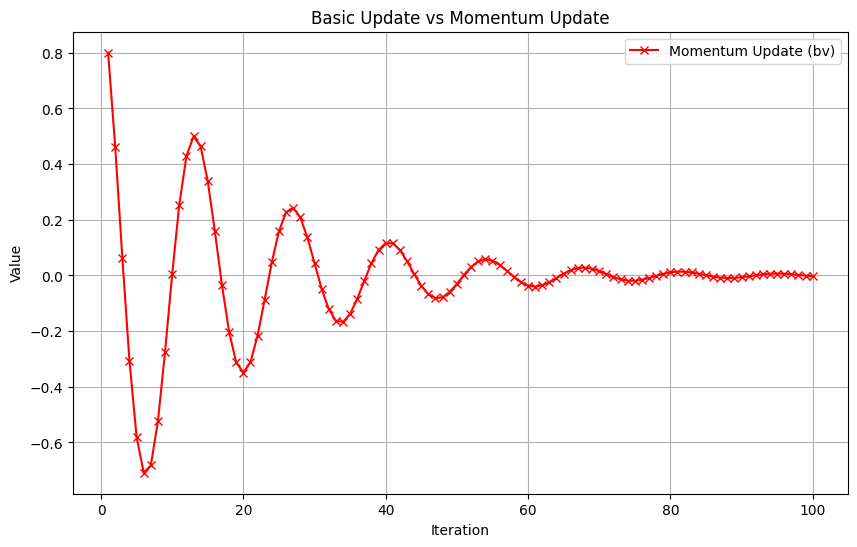

In [ ]:
import matplotlib.pyplot as plt

w =  1

n = 10

av=[]
for i in range(0,10):
  a = 0.2*n*w

  av.append(a)
  w=a


w = 1
n = 10
b = 0.9
b_t = 0  # Initialize velocity (momentum term)

bv=[]
for i in range(0, 100):
    grad = 0.2 *  w  # The gradient-like term you calculate
    b_t = b * b_t + (1 - b) * grad  # Update velocity with momentum
    a = w - n *b_t  # Parameter update (subtracting the velocity)

    bv.append(a)

    w = a  # Update the weight for the next iteration


# Plotting the two lists
plt.figure(figsize=(10, 6))

# # Plot av
# plt.plot(range(1, len(av) + 1), av, label='Basic Update (av)', marker='o', linestyle='-', color='blue')

# Plot bv
plt.plot(range(1, len(bv) + 1), bv, label='Momentum Update (bv)', marker='x', linestyle='-', color='red')

plt.xlabel('Iteration')
plt.ylabel('Value')
plt.title('Basic Update vs Momentum Update')
plt.legend()
plt.grid(True)

plt.show()

In [ ]:
bv[99]

-0.0028514111211826332

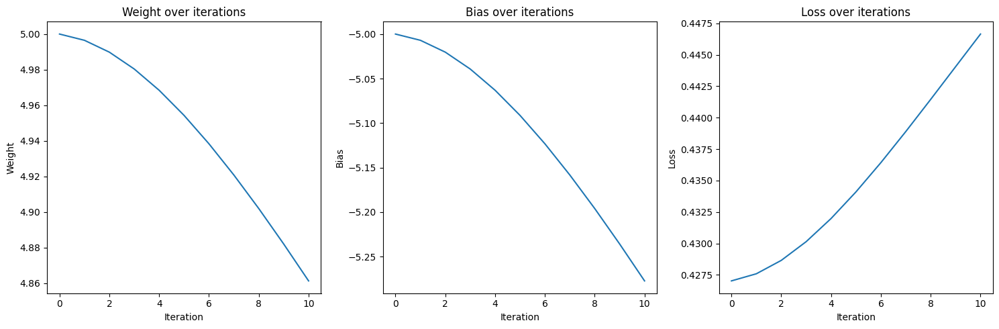

Final weight: 4.861375647769006
Final bias: -5.277248704461992
Final loss: 0.44664541263857116


In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt

def sigmoid(z):
    return 1 / (1 + math.exp(-z))
def sigmoid_gradient(z):
  sig = sigmoid(z)
  return sig * (1 - sig)

def loss(y_pred, y_true):
    return 0.5 * (y_pred - y_true)**2

def nesterov_update(w, b, v_w, v_b, x, y, beta, eta):
    # Look-ahead step
    w_lookahead = w + beta * v_w
    b_lookahead = b + beta * v_b

    # Compute gradient at look-ahead position
    z_lookahead = (w_lookahead * x) + b_lookahead
    y_pred_lookahead = sigmoid(z_lookahead)


    grad_common =  sigmoid_gradient(z_lookahead)
    grad_w = grad_common * x
    grad_b = grad_common

    # Update velocities
    v_w = beta * v_w + eta * grad_w
    v_b = beta * v_b + eta * grad_b

    # Update parameters
    w -= v_w
    b -= v_b

    return w, b, v_w, v_b

# Initialize parameters
x = 0.5
y = 1
w = 5
b = -5
beta = 0.9
eta = 0.1
v_w, v_b = 0, 0

# Lists to store values for plotting
weights = [w]
biases = [b]
losses = [loss(sigmoid(w*x + b), y)]

# Run the algorithm for a number of iterations
num_iterations = 10
for _ in range(num_iterations):
    w, b, v_w, v_b = nesterov_update(w, b, v_w, v_b, x, y, beta, eta)
    weights.append(w)
    biases.append(b)
    losses.append(loss(sigmoid(w*x + b), y))

# Plot the results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(weights)
plt.title('Weight over iterations')
plt.xlabel('Iteration')
plt.ylabel('Weight')

plt.subplot(1, 3, 2)
plt.plot(biases)
plt.title('Bias over iterations')
plt.xlabel('Iteration')
plt.ylabel('Bias')

plt.subplot(1, 3, 3)
plt.plot(losses)
plt.title('Loss over iterations')
plt.xlabel('Iteration')
plt.ylabel('Loss')

plt.tight_layout()
plt.show()

print(f"Final weight: {weights[-1]}")
print(f"Final bias: {biases[-1]}")
print(f"Final loss: {losses[-1]}")

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

class SigmoidNeuron(nn.Module):
    def __init__(self):
        super(SigmoidNeuron, self).__init__()
        self.linear = nn.Linear(1, 1, bias=False)  # No bias for simplicity
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.linear(x)
        x = self.sigmoid(x)
        return x
# Custom Mean Squared Error Loss with 1/2 factor
class CustomMSELoss(nn.Module):
    def forward(self, output, target):
        return 0.5 * torch.mean((output - target) ** 2)

# Create the model
model = SigmoidNeuron()

# Mean Squared Error loss function
criterion = CustomMSELoss()


# Example input and target
input_tensor = torch.tensor([[0.5]], dtype=torch.float32, requires_grad=True)
target_tensor = torch.tensor([[1.0]], dtype=torch.float32)

# Forward pass
output = model(input_tensor)

# Compute loss
loss = criterion(output, target_tensor)

# Manual gradient calculation
w = model.linear.weight.item()
x = input_tensor.item()
z = x * w
y_hat = 1 / (1 + torch.exp(-torch.tensor(z))).item()
y = target_tensor.item()

# Corrected gradient calculation
dL_dy_hat = y_hat - y  # This is the correct gradient for MSE
dy_hat_dz = y_hat * (1 - y_hat)
dz_dw = x

manual_gradient = dL_dy_hat * dy_hat_dz * dz_dw

# Perform backward pass
optimizer = optim.SGD(model.parameters(), lr=.1)
optimizer.zero_grad()
loss.backward()

# Get the automatic gradient from PyTorch
auto_gradient = model.linear.weight.grad.item()

print(f"Manual Gradient: {manual_gradient}")
print(f"PyTorch Auto Gradient: {auto_gradient}")

if torch.isclose(torch.tensor(manual_gradient), torch.tensor(auto_gradient), atol=1e-6):
    print("The gradients match!")
else:
    print("The gradients do not match.")

Manual Gradient: -0.061721794845379666
PyTorch Auto Gradient: -0.0617217943072319
The gradients match!


In [ ]:
z

0.02460479736328125

In [ ]:
1 / (1 + torch.exp(-torch.tensor(z))).item()

0.5061509048209611

In [ ]:
y_hat = 0.7088

y = 1

# Corrected gradient calculation
dL_dy_hat = y_hat - y  # This is the correct gradient for MSE
dy_hat_dz = y_hat * (1 - y_hat)
dz_dw = 0.5

manual_gradient = dL_dy_hat * dy_hat_dz * dz_dw
manual_gradient

-0.030052212736000002

In [ ]:
# programming assignment 1

In [ ]:
from sklearn.datasets import fetch_california_housing



# Load the California Housing dataset

california_housing = fetch_california_housing()



# Extract features and target for a quick look

features, target = california_housing.data, california_housing.target


In [ ]:
features.shape

(20640, 8)

SyntaxError: incomplete input (<ipython-input-7-131d9c14d8d8>, line 9)

In [ ]:
from sklearn.datasets import fetch_california_housing

housing = fetch_california_housing()

print(housing.data.shape, housing.target.shape)

print(len(housing.feature_names))

(20640, 8) (20640,)
8


In [ ]:
housing

{'data': array([[   8.3252    ,   41.        ,    6.98412698, ...,    2.55555556,
           37.88      , -122.23      ],
        [   8.3014    ,   21.        ,    6.23813708, ...,    2.10984183,
           37.86      , -122.22      ],
        [   7.2574    ,   52.        ,    8.28813559, ...,    2.80225989,
           37.85      , -122.24      ],
        ...,
        [   1.7       ,   17.        ,    5.20554273, ...,    2.3256351 ,
           39.43      , -121.22      ],
        [   1.8672    ,   18.        ,    5.32951289, ...,    2.12320917,
           39.43      , -121.32      ],
        [   2.3886    ,   16.        ,    5.25471698, ...,    2.61698113,
           39.37      , -121.24      ]]),
 'target': array([4.526, 3.585, 3.521, ..., 0.923, 0.847, 0.894]),
 'frame': None,
 'target_names': ['MedHouseVal'],
 'feature_names': ['MedInc',
  'HouseAge',
  'AveRooms',
  'AveBedrms',
  'Population',
  'AveOccup',
  'Latitude',
  'Longitude'],
 'DESCR': '.. _california_housing_dataset:\n

In [ ]:
from sklearn.datasets import fetch_california_housing
import pandas as pd

# Load the dataset
data = fetch_california_housing()

# Convert to DataFrame for easier handling
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target  # Add target column

# Display the first few rows of the DataFrame
print(df.head())

   MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
0  8.3252      41.0  6.984127   1.023810       322.0  2.555556     37.88   
1  8.3014      21.0  6.238137   0.971880      2401.0  2.109842     37.86   
2  7.2574      52.0  8.288136   1.073446       496.0  2.802260     37.85   
3  5.6431      52.0  5.817352   1.073059       558.0  2.547945     37.85   
4  3.8462      52.0  6.281853   1.081081       565.0  2.181467     37.85   

   Longitude  target  
0    -122.23   4.526  
1    -122.22   3.585  
2    -122.24   3.521  
3    -122.25   3.413  
4    -122.25   3.422  


In [ ]:
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Load the dataset
data = fetch_california_housing()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

# Split the data into features and target
X = df.drop('target', axis=1)
y = df['target']

# Split into training and test sets (80% train, 20% test), with random_state for reproducibility
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


In [ ]:
min(X_test[-1])

-0.9211376319710947

In [ ]:
max(X_test[-1])

0.6044549279679837

In [ ]:
import torch

In [ ]:
# Convert to PyTorch tensors with dtype=torch.float32
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values.reshape(-1, 1), dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values.reshape(-1, 1), dtype=torch.float32)

In [ ]:
y_train_tensor.shape

torch.Size([16512, 1])

In [ ]:
X_train_tensor.shape

torch.Size([16512, 8])

In [ ]:
import torch
import torch.nn as nn

torch.manual_seed(42)


# Define the neural network class
class RegressionANN(nn.Module):
    def __init__(self):
        super(RegressionANN, self).__init__()
        # Define layers
        self.input_layer = nn.Linear(8, 16)  # Input layer with 8 neurons, hidden layer with 16 neurons
        self.hidden_layer = nn.Linear(16,1 )  # Additional hidden layer
        self.output_layer = nn.Linear(1, 1)  # Output layer with 1 neuron for regression

    def forward(self, x):
        x = self.input_layer(x)               # No activation after input layer
        x = torch.relu(self.hidden_layer(x))  # ReLU activation after the hidden layer
        x = self.output_layer(x)              # Output layer (no activation for regression)
        return x

# Create an instance of the RegressionANN class
model = RegressionANN()


In [ ]:
initial_bias_output_layer = model.output_layer.bias
print("Initial bias in the output layer:", initial_bias_output_layer)

Initial bias in the output layer: Parameter containing:
tensor([0.1286], requires_grad=True)


In [ ]:
import torch.optim as optim
# Initialize the loss function
loss_function = nn.MSELoss()  # Mean Squared Error Loss

# Initialize the optimizer
optimizer = optim.Adam(model.parameters(), lr=0.01)

In [ ]:

predicted_output = model(X_train_tensor)

# Calculate the initial loss value
initial_loss = loss_function(predicted_output, y_train_tensor)

# print("Predicted Output:", predicted_output.item())
print("Initial Loss Value:", initial_loss.item())

Initial Loss Value: 4.852490425109863


In [ ]:
num_epochs = 100
a=0
for epoch in range(num_epochs):
  a+=1
a

100

In [ ]:
# Set the number of epochs
num_epochs = 100  # Adjust as needed

# Training loop
for epoch in range(num_epochs):
    # Zero the gradients
    optimizer.zero_grad()

    # Making predictions
    predicted_output = model(X_train_tensor)

    # Computing the loss
    loss = loss_function(predicted_output, y_train_tensor)

    # Backpropagation
    loss.backward()

    # Updating parameters
    optimizer.step()


In [ ]:
# Final loss after training
print(f'Final Loss after {num_epochs} epochs: {loss.item():.4f}')

Final Loss after 100 epochs: 0.4591


In [ ]:
import torch
import torch.nn as nn

torch.manual_seed(42)


# Define the neural network class
class RegressionANN(nn.Module):
    def __init__(self):
        super(RegressionANN, self).__init__()
        # Define layers
        self.input_layer = nn.Linear(8, 64)  # Input layer with 8 neurons, hidden layer with 16 neurons
        self.hidden_layer = nn.Linear(64,1 )  # Additional hidden layer
        self.output_layer = nn.Linear(1, 1)  # Output layer with 1 neuron for regression

    def forward(self, x):
        x = self.input_layer(x)               # No activation after input layer
        x = torch.relu(self.hidden_layer(x))  # ReLU activation after the hidden layer
        x = self.output_layer(x)              # Output layer (no activation for regression)
        return x

# Create an instance of the RegressionANN class
model = RegressionANN()


import torch.optim as optim
# Initialize the loss function
loss_function = nn.MSELoss()  # Mean Squared Error Loss

# Initialize the optimizer
optimizer = optim.Adam(model.parameters(), lr=0.01)

In [ ]:
# Set the number of epochs
num_epochs = 100  # Adjust as needed

# Training loop
for epoch in range(num_epochs):
    # Zero the gradients
    optimizer.zero_grad()

    # Making predictions
    predicted_output = model(X_train_tensor)

    # Computing the loss
    loss = loss_function(predicted_output, y_train_tensor)

    # Backpropagation
    loss.backward()

    # Updating parameters
    optimizer.step()


In [ ]:
# Final loss after training
print(f'Final Loss after {num_epochs} epochs: {loss.item():.4f}')

Final Loss after 100 epochs: 1.4882


Weights from Momentum Gradient Descent:
Iteration 0: Weight = -2.000000
Iteration 1: Weight = -1.960000
Iteration 2: Weight = -1.884800
Iteration 3: Weight = -1.779424
Iteration 4: Weight = -1.648997
Iteration 5: Weight = -1.498633
Iteration 6: Weight = -1.333333
Iteration 7: Weight = -1.157896
Iteration 8: Weight = -0.976844
Iteration 9: Weight = -0.794361
Iteration 10: Weight = -0.614240

Weights from Adam Optimizer:
Iteration 0: Weight = -2.000000
Iteration 1: Weight = -1.900000
Iteration 2: Weight = -1.800166
Iteration 3: Weight = -1.700623
Iteration 4: Weight = -1.601505
Iteration 5: Weight = -1.502956
Iteration 6: Weight = -1.405132
Iteration 7: Weight = -1.308199
Iteration 8: Weight = -1.212337
Iteration 9: Weight = -1.117733
Iteration 10: Weight = -1.024587


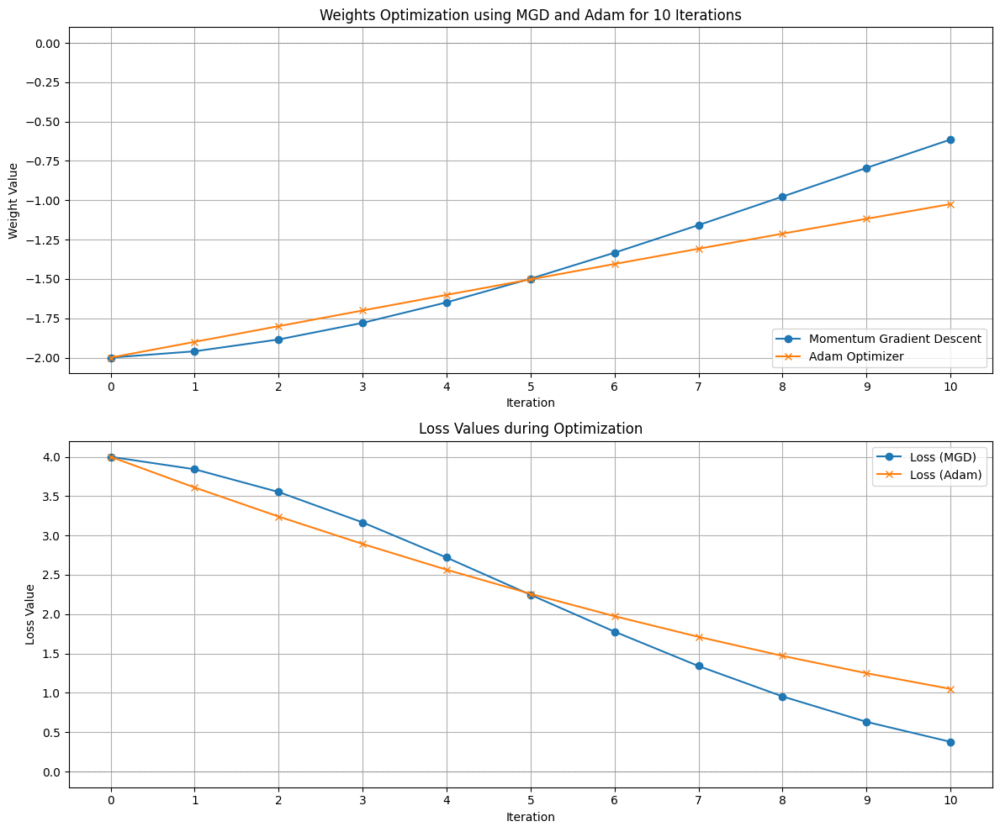

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the loss function and its gradient
def loss(w):
    return w**2

def gradient(w):
    return 2 * w

# Parameters
w0 = -2.0  # Initial weight
learning_rate = 0.1  # Initial learning rate
num_iterations = 10  # Number of iterations

# Momentum-based Gradient Descent (MGD)
def momentum_gradient_descent(w0, learning_rate, num_iterations, beta=0.9):
    w = w0
    v = 0  # Initialize velocity
    weights_mgd = [w]  # To store weights for plotting
    losses_mgd = [loss(w)]  # To store losses for plotting

    for _ in range(num_iterations):
        grad = gradient(w)
        v = beta * v + (1 - beta) * grad  # Update velocity
        w -= learning_rate * v  # Update weight
        weights_mgd.append(w)
        losses_mgd.append(loss(w))  # Record the loss

    return weights_mgd, losses_mgd

# Adam Optimizer
def adam_optimizer(w0, learning_rate, num_iterations, beta1=0.9, beta2=0.999, epsilon=1e-8):
    w = w0
    m = 0  # Initialize first moment
    v = 0  # Initialize second moment
    t = 0  # Time step
    weights_adam = [w]  # To store weights for plotting
    losses_adam = [loss(w)]  # To store losses for plotting

    for _ in range(num_iterations):
        t += 1
        grad = gradient(w)

        m = beta1 * m + (1 - beta1) * grad  # Update first moment
        v = beta2 * v + (1 - beta2) * (grad**2)  # Update second moment

        m_hat = m / (1 - beta1**t)  # Bias correction for first moment
        v_hat = v / (1 - beta2**t)  # Bias correction for second moment

        w -= learning_rate * m_hat / (np.sqrt(v_hat) + epsilon)  # Update weight
        weights_adam.append(w)
        losses_adam.append(loss(w))  # Record the loss

    return weights_adam, losses_adam

# Run both optimizers
weights_mgd, losses_mgd = momentum_gradient_descent(w0, learning_rate, num_iterations)
weights_adam, losses_adam = adam_optimizer(w0, learning_rate, num_iterations)

# Display the final weights after each iteration
print("Weights from Momentum Gradient Descent:")
for i, weight in enumerate(weights_mgd):
    print(f"Iteration {i}: Weight = {weight:.6f}")

print("\nWeights from Adam Optimizer:")
for i, weight in enumerate(weights_adam):
    print(f"Iteration {i}: Weight = {weight:.6f}")

# Plotting the results
plt.figure(figsize=(12, 10))

# Plot weights
plt.subplot(2, 1, 1)
plt.plot(weights_mgd, label='Momentum Gradient Descent', marker='o')
plt.plot(weights_adam, label='Adam Optimizer', marker='x')
plt.title('Weights Optimization using MGD and Adam for 10 Iterations')
plt.xlabel('Iteration')
plt.ylabel('Weight Value')
plt.axhline(0, color='gray', lw=0.5, ls='--')  # Line at w=0
plt.xticks(range(num_iterations + 1))  # Set x-ticks for all iterations
plt.legend()
plt.grid()

# Plot losses
plt.subplot(2, 1, 2)
plt.plot(losses_mgd, label='Loss (MGD)', marker='o')
plt.plot(losses_adam, label='Loss (Adam)', marker='x')
plt.title('Loss Values during Optimization')
plt.xlabel('Iteration')
plt.ylabel('Loss Value')
plt.axhline(0, color='gray', lw=0.5, ls='--')  # Line at loss=0
plt.xticks(range(num_iterations + 1))  # Set x-ticks for all iterations
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np

# Define the sigmoid activation function
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Define the mean squared error loss function
def compute_loss(y, y_hat):
    return 0.5 * np.sum((y - y_hat) ** 2)

# Define the network parameters
w1 = np.array([[10, 0.1], [0.25, 10]])
b1 = np.array([1, 1])
w2 = np.array([[10, 0.1], [0.25, 10]])
b2 = np.array([1, 1])
w3 = np.array([10, 0.1])
b3 = np.array([1])

# Input and true label
x = np.array([0, 0])
y_true = np.array([0])

# Forward propagation
# Layer 1
z1 = np.dot(x, w1) + b1
a1 = sigmoid(z1)

# Layer 2
z2 = np.dot(a1, w2) + b2
a2 = sigmoid(z2)

# Output layer
z3 = np.dot(a2, w3) + b3
y_hat = sigmoid(z3)

# Compute the loss
loss = compute_loss(y_true, y_hat)

print(f"Output (y_hat): {y_hat}")
print(f"Loss: {loss}")


Output (y_hat): [0.99998486]
Loss: 0.49998485669480425


In [ ]:
dL_dy_hat = -(y_true - y_hat)

print(f"∂L/∂y_hat: {dL_dy_hat}")

∂L/∂y_hat: [0.99998486]


In [ ]:
# True label
y_true = np.array([0])

# Calculate intermediate gradients
dL_dy_hat = -(y_true - y_hat)  # ∂L/∂y_hat
dy_hat_dz3 = y_hat * (1 - y_hat)  # ∂y_hat/∂z3
dz3_dw31 = a2[0]  # ∂z3/∂w31, where a2[0] is the first element of a2

# Combine to get the gradient of L with respect to w31
dL_dw31 = dL_dy_hat * dy_hat_dz3 * dz3_dw31

# Round to 2 decimal places and print
dL_dw31_rounded = np.round(dL_dw31, 2)  # Round the array
print(f"Gradient of the loss with respect to w31 (∇w31): {dL_dw31_rounded}")


Gradient of the loss with respect to w31 (∇w31): [0.]


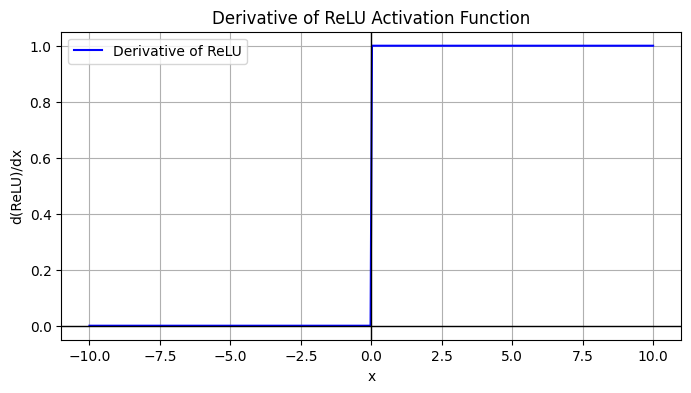

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the ReLU derivative function
def relu_derivative(x):
    return np.where(x > 0, 1, 0)

# Generate a range of values for x
x = np.linspace(-10, 10, 400)

# Compute the derivative of ReLU for each value of x
y = relu_derivative(x)

# Plot the derivative of ReLU
plt.figure(figsize=(8, 4))
plt.plot(x, y, label="Derivative of ReLU", color='blue')
plt.axhline(0, color='black',linewidth=1)
plt.axvline(0, color='black',linewidth=1)
plt.title("Derivative of ReLU Activation Function")
plt.xlabel("x")
plt.ylabel("d(ReLU)/dx")
plt.grid(True)
plt.legend()
plt.show()


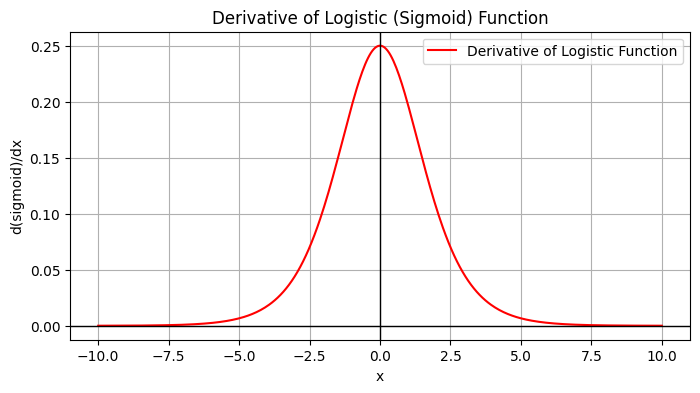

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the logistic (sigmoid) function
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Define the derivative of the logistic function
def sigmoid_derivative(x):
    s = sigmoid(x)
    return s * (1 - s)

# Generate a range of values for x
x = np.linspace(-10, 10, 400)

# Compute the derivative of the logistic function for each value of x
y = sigmoid_derivative(x)

# Plot the derivative of the logistic (sigmoid) function
plt.figure(figsize=(8, 4))
plt.plot(x, y, label="Derivative of Logistic Function", color='red')
plt.axhline(0, color='black',linewidth=1)
plt.axvline(0, color='black',linewidth=1)
plt.title("Derivative of Logistic (Sigmoid) Function")
plt.xlabel("x")
plt.ylabel("d(sigmoid)/dx")
plt.grid(True)
plt.legend()
plt.show()


In [ ]:
import numpy as np

# Define sigmoid activation function
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Network parameters
W1 = np.array([[10, 0.25], [0.1, 10]])
W2 = np.array([[10, 0.25], [0.1, 10]])
W3 = np.array([10, 0.1])
b1 = np.array([1, 1])
b2 = np.array([1, 1])
b3 = np.array([1])

# Input and true label
x = np.array([0, 0])
y_true = 0

# Forward propagation
# First layer
z1 = np.dot(W1, x) + b1
a1 = sigmoid(z1)

# Second layer
z2 = np.dot(W2, a1) + b2
a2 = sigmoid(z2)

# Output layer
z3 = np.dot(W3, a2) + b3
y_pred = sigmoid(z3)  # Final output after sigmoid

# Compute loss
loss = 0.5 * (y_true - y_pred)**2

# Print intermediate values and final results
print(f"Layer 1 - z1: {z1}")
print(f"Layer 1 - a1: {a1}")
print(f"Layer 2 - z2: {z2}")
print(f"Layer 2 - a2: {a2}")
print(f"Output layer - z3: {z3}")
print(f"Predicted output: {y_pred}")
print(f"Loss: {loss}")

Layer 1 - z1: [1. 1.]
Layer 1 - a1: [0.73105858 0.73105858]
Layer 2 - z2: [8.49335043 8.38369164]
Layer 2 - a2: [0.99979522 0.99977149]
Output layer - z3: [11.09792931]
Predicted output: [0.99998486]
Loss: [0.49998486]


In [ ]:
# Compute ∂L/∂yhat
dL_dyhat = y_pred - y_true
dL_dyhat

array([0.99998486])

In [ ]:
import numpy as np

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    s = sigmoid(x)
    return s * (1 - s)

# Network parameters
W1 = np.array([[10, 0.1], [0.25, 10]])
W2 = np.array([[10, 0.1], [0.25, 10]])
W3 = np.array([10, 0.1])
b1 = np.array([1, 1])
b2 = np.array([1, 1])
b3 = np.array([1])

# Input and true label
x = np.array([0, 0])
y_true = 0

# Forward propagation
# First layer
z1 = np.dot(W1, x) + b1
a1 = sigmoid(z1)

# Second layer
z2 = np.dot(W2, a1) + b2
a2 = sigmoid(z2)

# Output layer
z3 = np.dot(W3, a2) + b3
y_pred = sigmoid(z3)

# Compute gradients
# ∂L/∂yhat
dL_dyhat = y_pred - y_true

# ∂yhat/∂z3 = sigmoid_derivative(z3)
dyhat_dz3 = sigmoid_derivative(z3)

# ∂z3/∂W31 = a2[0] (first activation from previous layer)
dz3_dW31 = a2[0]

# Chain rule: multiply all partial derivatives
dL_dW31 = dL_dyhat * dyhat_dz3 * dz3_dW31

print(f"Predicted output (yhat): {y_pred:.4f}")
print(f"∂L/∂yhat: {dL_dyhat:.4f}")
print(f"∂yhat/∂z3: {dyhat_dz3:.4f}")
print(f"∂z3/∂W31: {dz3_dW31:.4f}")
print(f"∂L/∂W31 (rounded to 2 decimal places): {dL_dW31:.2f}")

TypeError: unsupported format string passed to numpy.ndarray.__format__

In [ ]:
dL_dW31

array([1.51430576e-05])

In [ ]:
import numpy as np
from scipy.signal import convolve2d

# Example matrices
XX = np.array([[1, -1, 2, 2],
               [0,  0, 0, 0],
               [1, -1, 2, -2]])

KK = np.array([[0.6, -0.2]])

# Compute the convolution
a1 = convolve2d(XX, KK, mode='valid')  # Perform the convolution

# Apply stride of 2 by slicing the result
stride = 2
a1_strided = a1[::stride, ::stride]  # Take every 2nd row and column

print("Convolution Result with Stride 2:")
print(a1_strided)
print(np.sum(a1_strided))


# Define the sigmoid function

def sigmoid(x):

    return 1 / (1 + np.exp(-x))



# Apply the sigmoid function to a1

h1 = sigmoid(a1_strided)



# Calculate the sum of elements in h1

sum_h1 = np.sum(h1)



print(h1, sum_h1)

a2 = np.sum(h1.flatten())



print(a2)


# Apply the sigmoid function to a2 to compute h2
h2 = sigmoid(a2)

h2
print(h2)

loss = 0.5*((h2-0.1)**2),'loss'
print(loss)

Convolution Result with Stride 2:
[[-0.8  0.8]
 [-0.8 -1.6]]
-2.4000000000000004
[[0.31002552 0.68997448]
 [0.31002552 0.16798161]] 1.478007133738463
1.478007133738463
0.8142713813105851
(0.2550918030796656, 'loss')


In [ ]:
# Define target value and learning rate
y = 0.1  # Target value for MSE
eta = 1  # Learning rate

# Step 1: Compute dL/dh2
dL_dh2 = h2 - y

# Step 2: Compute dL/da2 using the derivative of sigmoid
dL_da2 = dL_dh2 * h2 * (1 - h2)
print(dL_da2)

# Step 3: Backpropagate to h1
# Since a2 = sum(h1), the gradient is distributed equally across all elements of h1
dL_dh1 = dL_da2

# Step 4: Compute dL/da1_strided (backprop through sigmoid for h1)
dL_da1 = dL_dh1 * h1 * (1 - h1)

# Step 5: Backpropagate through convolution to compute gradients for KK
grad_KK = np.zeros_like(KK)  # Initialize gradient matrix for KK
for i in range(KK.shape[0]):
    for j in range(KK.shape[1]):
        # Compute gradient for KK[i, j] by summing relevant contributions
        grad_KK[i, j] = np.sum(dL_da1 * XX[i:i + a1_strided.shape[0] * stride:stride,
                                            j:j + a1_strided.shape[1] * stride:stride])

# Step 6: Update the weights
KK_updated = KK - eta * grad_KK

KK_updated


0.1080217601519766


array([[ 0.47737733, -0.16980494]])

In [ ]:
# Initialize the learning rate
eta = 1

# Compute dL/da2 (as derived earlier)
dL_da2 = (h2 - 0.1) * h2 * (1 - h2)

# Backpropagate to compute gradients for each element in h1
# Contribution to each weight is based on its input (XX) and the gradient from h1
grad_kk = np.zeros_like(KK)  # Initialize gradients for KK

# Iterate over the kernel elements
for i in range(KK.shape[0]):
    for j in range(KK.shape[1]):
        # Compute gradient for KK[i, j] by summing over all regions of a1_strided affected by KK[i, j]
        grad_kk[i, j] = np.sum(dL_da2 * h1 * (1 - h1) * XX[i:i + a1_strided.shape[0], j:j + a1_strided.shape[1]])

# Update the weights for KK
KK_updated = KK - eta * grad_kk

KK_updated


array([[ 0.6      , -0.2231069]])

In [ ]:
#coding assignment 2

In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Set the random seed for reproducibility
torch.manual_seed(42)

# Define the transformations
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert images to PyTorch tensors
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))  # Normalize to [-1, 1]
])

# Download and preprocess the CIFAR-10 dataset
train_dataset = datasets.CIFAR10(root="./data", train=True, download=True, transform=transform)
test_dataset = datasets.CIFAR10(root="./data", train=False, download=True, transform=transform)

# Create DataLoaders for training and testing
train_loader = DataLoader(train_dataset, batch_size=100, shuffle=True)  # Shuffle for training
test_loader = DataLoader(test_dataset, batch_size=100, shuffle=False)  # No shuffle for testing

# Example: Checking the shape of one batch
data_iter = iter(train_loader)
images, labels = next(data_iter)
print(f"Image batch shape: {images.shape}")
print(f"Label batch shape: {labels.shape}")


100%|██████████| 170M/170M [00:02<00:00, 81.1MB/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
Image batch shape: torch.Size([100, 3, 32, 32])
Label batch shape: torch.Size([100])


In [ ]:
print(f"Number of images in the training dataset: {len(train_dataset)}")


Number of images in the training dataset: 50000


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        # Define layers
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=6, kernel_size=5)  # First convolutional layer
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)  # Max pooling layer
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5)  # Second convolutional layer

        # Fully connected layers
        self.fc1 = nn.Linear(in_features=16 * 5 * 5, out_features=120)  # First fully connected layer
        self.fc2 = nn.Linear(in_features=120, out_features=84)  # Second fully connected layer
        self.fc3 = nn.Linear(in_features=84, out_features=10)  # Third fully connected layer

    def forward(self, x):
        # Forward pass
        x = self.pool(F.relu(self.conv1(x)))  # Conv1 -> ReLU -> Pooling
        x = self.pool(F.relu(self.conv2(x)))  # Conv2 -> ReLU -> Pooling
        x = x.view(-1, 16 * 5 * 5)  # Flatten the output for fully connected layers
        x = F.relu(self.fc1(x))  # Fully connected layer 1 -> ReLU
        x = F.relu(self.fc2(x))  # Fully connected layer 2 -> ReLU
        x = self.fc3(x)  # Fully connected layer 3 (Output layer, no activation)
        return x


In [ ]:
model = Net()
total_params = sum(p.numel() for p in model.parameters())
print(f"Total number of parameters: {total_params}")


Total number of parameters: 62006


In [ ]:
import torch
import torch.optim as optim

# Initialize the model
model = Net()

# Define the loss function (Cross-Entropy Loss)
criterion = nn.CrossEntropyLoss()

# Define the optimizer (SGD with momentum)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

# Get a batch of training data
data_iter = iter(train_loader)
images, labels = next(data_iter)

# Forward pass
outputs = model(images)

# Calculate the initial loss
loss = criterion(outputs, labels)
print(f"Initial loss value: {loss.item()}")


Initial loss value: 2.311234951019287


In [ ]:
# Training the model
num_epochs = 2
for epoch in range(num_epochs):
    running_loss = 0.0
    for i, (inputs, labels) in enumerate(train_loader, 0):
        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)

        # Compute loss
        loss = criterion(outputs, labels)

        # Backward pass
        loss.backward()

        # Update parameters
        optimizer.step()

        # Accumulate loss for tracking
        running_loss += loss.item()

    # Print the average loss for the epoch
    print(f"Epoch {epoch + 1}, Loss: {running_loss / len(train_loader)}")

# Final loss value after 2 epochs
final_loss = running_loss / len(train_loader)
print(f"Final loss value after 2 epochs: {final_loss}")


Epoch 1, Loss: 1.9541029846668243
Epoch 2, Loss: 1.4759569671154023
Final loss value after 2 epochs: 1.4759569671154023


In [ ]:
# 	Use torch.no_grad() to disable gradient tracking during testing.
# 	Iterate over the testloader to get batches of test data.

# For each batch of data:

# 	Extract the images and their corresponding labels.
# 	Perform a forward pass through the network to get the predicted outputs.
# 	Get the predicted labels by taking the maximum value along the predicted output tensor.
# 	Update the total count of test samples.
# 	Count the number of correct predictions and update the correct variable. Calculate the accuracy of the network on the test dataset

In [ ]:
# 	Use torch.no_grad() to disable gradient tracking during testing.
# 	Iterate over the testloader to get batches of test data.

# For each batch of data:

# 	Extract the images and their corresponding labels.
# 	Perform a forward pass through the network to get the predicted outputs.
# 	Get the predicted labels by taking the maximum value along the predicted output tensor.
# 	Update the total count of test samples.
# 	Count the number of correct predictions and update the correct variable. Calculate the accuracy of the network on the test dataset

In [ ]:
# Testing the model
correct = 0
total = 0

# Disable gradient tracking during testing
with torch.no_grad():
    for inputs, labels in test_loader:
        # Forward pass to get predicted outputs
        outputs = model(inputs)

        # Get the predicted labels by taking the maximum value across the output tensor
        _, predicted = torch.max(outputs, 1)

        # Update the total count of test samples
        total += labels.size(0)

        # Update the correct predictions count
        correct += (predicted == labels).sum().item()

# Calculate the accuracy
accuracy = 100 * correct / total
print(f"Accuracy of the network on the test dataset: {accuracy:.2f}%")


Accuracy of the network on the test dataset: 50.21%


In [ ]:
# Define the corpus
corpus = [
    "knowing the name of something is different from knowing something",
    "knowing something about everything is alright"
]

# Split the corpus into words and create a set of unique words
vocabulary = set(word for sentence in corpus for word in sentence.split())

# Compute the size of the vocabulary
vocabulary_size = len(vocabulary)

# Print the size of the vocabulary
print("Size of the vocabulary:", vocabulary_size)


Size of the vocabulary: 11


In [ ]:
# Create a mapping of words to one-hot vectors
word_to_one_hot = {word: [1 if i == idx else 0 for i in range(vocabulary_size)]
                   for idx, word in enumerate(vocabulary)}

# Print the one-hot vectors and their size
print("Vocabulary Size:", vocabulary_size)
print("\nOne-Hot Vectors:")
for word, vector in word_to_one_hot.items():
    print(f"{word}: {vector}")

# Print the size of the one-hot vector
print("\nSize of each one-hot vector:", len(next(iter(word_to_one_hot.values()))))

Vocabulary Size: 11

One-Hot Vectors:
name: [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
knowing: [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
from: [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
everything: [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]
about: [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
the: [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0]
something: [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0]
alright: [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0]
of: [0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]
is: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]
different: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]

Size of each one-hot vector: 11


In [ ]:
# Define the corpus
corpus = [
    "knowing the name of something is different from knowing something",
    "knowing something about everything is alright"
]

# Words to drop
words_to_remove = {"of", "the", "alright", "about", "from"}

# Preprocess: Remove unwanted words and split sentences into words
processed_corpus = [
    [word for word in sentence.split() if word not in words_to_remove]
    for sentence in corpus
]

# Create the vocabulary
vocabulary = sorted(set(word for sentence in processed_corpus for word in sentence))
vocabulary_size = len(vocabulary)

# Initialize co-occurrence matrix
co_occurrence_matrix = {word: {w: 0 for w in vocabulary} for word in vocabulary}

# Populate co-occurrence matrix with window size k=1
for sentence in processed_corpus:
    for i, word in enumerate(sentence):
        if word in vocabulary:
            # Check the previous word
            if i > 0 and sentence[i - 1] in vocabulary:
                co_occurrence_matrix[word][sentence[i - 1]] += 1
            # Check the next word
            if i < len(sentence) - 1 and sentence[i + 1] in vocabulary:
                co_occurrence_matrix[word][sentence[i + 1]] += 1

# Count non-zero entries in the co-occurrence matrix
non_zero_entries = sum(
    1 for word, co_occurrences in co_occurrence_matrix.items()
    for count in co_occurrences.values() if count > 0
)

# Print the result
print("Vocabulary:", vocabulary)
print("Co-occurrence Matrix:")
for word, co_occurrences in co_occurrence_matrix.items():
    print(f"{word}: {co_occurrences}")

print("\nNumber of non-zero entries:", non_zero_entries)


Vocabulary: ['different', 'everything', 'is', 'knowing', 'name', 'something']
Co-occurrence Matrix:
different: {'different': 0, 'everything': 0, 'is': 1, 'knowing': 1, 'name': 0, 'something': 0}
everything: {'different': 0, 'everything': 0, 'is': 1, 'knowing': 0, 'name': 0, 'something': 1}
is: {'different': 1, 'everything': 1, 'is': 0, 'knowing': 0, 'name': 0, 'something': 1}
knowing: {'different': 1, 'everything': 0, 'is': 0, 'knowing': 0, 'name': 1, 'something': 2}
name: {'different': 0, 'everything': 0, 'is': 0, 'knowing': 1, 'name': 0, 'something': 1}
something: {'different': 0, 'everything': 1, 'is': 1, 'knowing': 2, 'name': 1, 'something': 0}

Number of non-zero entries: 16


In [ ]:
import pandas as pd
from collections import Counter

# Define the corpus
corpus = [
    "knowing the name of something is different from knowing something",
    "knowing something about everything is alright"
]

# Words to drop
words_to_remove = {"of", "the", "alright", "about", "from"}

# Preprocess: Remove unwanted words and split sentences into words
processed_corpus = [
    [word for word in sentence.split() if word not in words_to_remove]
    for sentence in corpus
]

# Create the vocabulary
vocabulary = sorted(set(word for sentence in processed_corpus for word in sentence))

# Initialize co-occurrence matrix
co_occurrence_matrix = pd.DataFrame(0, index=vocabulary, columns=vocabulary)

# Populate the co-occurrence matrix with window size k=1
for sentence in processed_corpus:
    for i, word in enumerate(sentence):
        if word in vocabulary:
            # Check the previous word
            if i > 0 and sentence[i - 1] in vocabulary:
                co_occurrence_matrix.at[word, sentence[i - 1]] += 1
            # Check the next word
            if i < len(sentence) - 1 and sentence[i + 1] in vocabulary:
                co_occurrence_matrix.at[word, sentence[i + 1]] += 1

# Count non-zero entries
non_zero_entries = (co_occurrence_matrix > 0).sum().sum()

# Print results
print("Vocabulary:", vocabulary)
print("\nCo-occurrence Matrix:\n", co_occurrence_matrix)
print("\nNumber of non-zero entries:", non_zero_entries)


Vocabulary: ['different', 'everything', 'is', 'knowing', 'name', 'something']

Co-occurrence Matrix:
             different  everything  is  knowing  name  something
different           0           0   1        1     0          0
everything          0           0   1        0     0          1
is                  1           1   0        0     0          1
knowing             1           0   0        0     1          2
name                0           0   0        1     0          1
something           0           1   1        2     1          0

Number of non-zero entries: 16


In [ ]:
import numpy as np
import pandas as pd

# Define the corpus
corpus = [
    "knowing the name of something is different from knowing something",
    "knowing something about everything is alright"
]

# Words to drop
words_to_remove = {"of", "the", "alright", "about", "from"}

# Preprocess: Remove unwanted words and split sentences into words
processed_corpus = [
    [word for word in sentence.split() if word not in words_to_remove]
    for sentence in corpus
]

# Create the vocabulary
vocabulary = sorted(set(word for sentence in processed_corpus for word in sentence))

# Initialize co-occurrence matrix
co_occurrence_matrix = pd.DataFrame(0, index=vocabulary, columns=vocabulary)

# Populate the co-occurrence matrix with window size k=1
for sentence in processed_corpus:
    for i, word in enumerate(sentence):
        if word in vocabulary:
            # Check the previous word
            if i > 0 and sentence[i - 1] in vocabulary:
                co_occurrence_matrix.at[word, sentence[i - 1]] += 1
            # Check the next word
            if i < len(sentence) - 1 and sentence[i + 1] in vocabulary:
                co_occurrence_matrix.at[word, sentence[i + 1]] += 1

# Normalize the vectors (rows of the co-occurrence matrix) to have unit magnitude
def normalize_matrix(matrix):
    norms = np.linalg.norm(matrix, axis=1, keepdims=True)
    return matrix / norms

# Compute cosine similarity for the word 'knowing'
def cosine_similarity(matrix, word_idx):
    word_vector = matrix[word_idx]
    similarities = matrix.dot(word_vector)  # Dot product
    return similarities / (np.linalg.norm(word_vector) * np.linalg.norm(matrix, axis=1))

# Normalize the matrix
normalized_matrix = normalize_matrix(co_occurrence_matrix.values)

# Compute the cosine similarity for the word "knowing"
word_idx = co_occurrence_matrix.index.get_loc('knowing')
similarities = cosine_similarity(normalized_matrix, word_idx)

# Get the closest word
similarity_dict = {co_occurrence_matrix.index[i]: similarities[i] for i in range(len(similarities))}
closest_word = max(similarity_dict, key=similarity_dict.get)

# Print the results
print("Vocabulary:", vocabulary)
print("\nCo-occurrence Matrix:\n", co_occurrence_matrix)
print("\nNumber of non-zero entries:", (co_occurrence_matrix > 0).sum().sum())
print(f"\nCosine similarities for 'knowing':")
for word, sim in similarity_dict.items():
    print(f"{word}: {sim:.3f}")

print(f"\nThe word 'knowing' is closest to: {closest_word}")


Vocabulary: ['different', 'everything', 'is', 'knowing', 'name', 'something']

Co-occurrence Matrix:
             different  everything  is  knowing  name  something
different           0           0   1        1     0          0
everything          0           0   1        0     0          1
is                  1           1   0        0     0          1
knowing             1           0   0        0     1          2
name                0           0   0        1     0          1
something           0           1   1        2     1          0

Number of non-zero entries: 16

Cosine similarities for 'knowing':
different: 0.000
everything: 0.577
is: 0.707
knowing: 1.000
name: 0.577
something: 0.154

The word 'knowing' is closest to: knowing


In [ ]:
import numpy as np
import pandas as pd

# Define the corpus
corpus = [
    "knowing the name of something is different from knowing something",
    "knowing something about everything is alright"
]

# Words to drop
words_to_remove = {"of", "the", "alright", "about", "from"}

# Preprocess: Remove unwanted words and split sentences into words
processed_corpus = [
    [word for word in sentence.split() if word not in words_to_remove]
    for sentence in corpus
]

# Create the vocabulary
vocabulary = sorted(set(word for sentence in processed_corpus for word in sentence))

# Initialize co-occurrence matrix
co_occurrence_matrix = pd.DataFrame(0, index=vocabulary, columns=vocabulary)

# Populate the co-occurrence matrix with window size k=1
for sentence in processed_corpus:
    for i, word in enumerate(sentence):
        if word in vocabulary:
            # Check the previous word
            if i > 0 and sentence[i - 1] in vocabulary:
                co_occurrence_matrix.at[word, sentence[i - 1]] += 1
            # Check the next word
            if i < len(sentence) - 1 and sentence[i + 1] in vocabulary:
                co_occurrence_matrix.at[word, sentence[i + 1]] += 1

# Normalize the vectors (rows of the co-occurrence matrix) to have unit magnitude
def normalize_matrix(matrix):
    norms = np.linalg.norm(matrix, axis=1, keepdims=True)
    return matrix / norms

# Compute cosine similarity for the word 'knowing'
def cosine_similarity(matrix, word_idx):
    word_vector = matrix[word_idx]
    similarities = matrix.dot(word_vector)  # Dot product
    return similarities / (np.linalg.norm(word_vector) * np.linalg.norm(matrix, axis=1))

# Normalize the matrix
normalized_matrix = normalize_matrix(co_occurrence_matrix.values)

# Compute the cosine similarity for the word "knowing"
word_idx = co_occurrence_matrix.index.get_loc('knowing')
similarities = cosine_similarity(normalized_matrix, word_idx)

# Define the options you want to compare with 'knowing'
options = ['name', 'something', 'different', 'everything', 'is']

# Get cosine similarity only for the options
similarity_dict = {word: similarities[co_occurrence_matrix.index.get_loc(word)] for word in options}

# Find the closest word based on cosine similarity
closest_word = max(similarity_dict, key=similarity_dict.get)

# Print the results
print("Vocabulary:", vocabulary)
print("\nCo-occurrence Matrix:\n", co_occurrence_matrix)
print("\nNumber of non-zero entries:", (co_occurrence_matrix > 0).sum().sum())
print(f"\nCosine similarities for 'knowing' with options:")
for word, sim in similarity_dict.items():
    print(f"{word}: {sim:.3f}")

print(f"\nThe word 'knowing' is closest to: {closest_word}")


Vocabulary: ['different', 'everything', 'is', 'knowing', 'name', 'something']

Co-occurrence Matrix:
             different  everything  is  knowing  name  something
different           0           0   1        1     0          0
everything          0           0   1        0     0          1
is                  1           1   0        0     0          1
knowing             1           0   0        0     1          2
name                0           0   0        1     0          1
something           0           1   1        2     1          0

Number of non-zero entries: 16

Cosine similarities for 'knowing' with options:
name: 0.577
something: 0.154
different: 0.000
everything: 0.577
is: 0.707

The word 'knowing' is closest to: is


In [ ]:
import numpy as np
import pandas as pd

# Define the corpus
corpus = [
    "knowing the name of something is different from knowing something",
    "knowing something about everything is alright"
]

# Words to drop
words_to_remove = {"of", "the", "alright", "about", "from"}

# Preprocess: Remove unwanted words and split sentences into words
processed_corpus = [
    [word for word in sentence.split() if word not in words_to_remove]
    for sentence in corpus
]

# Create the vocabulary
vocabulary = sorted(set(word for sentence in processed_corpus for word in sentence))

# Initialize co-occurrence matrix
co_occurrence_matrix = pd.DataFrame(0, index=vocabulary, columns=vocabulary)

# Populate the co-occurrence matrix with window size k=1
for sentence in processed_corpus:
    for i, word in enumerate(sentence):
        if word in vocabulary:
            # Check the previous word
            if i > 0 and sentence[i - 1] in vocabulary:
                co_occurrence_matrix.at[word, sentence[i - 1]] += 1
            # Check the next word
            if i < len(sentence) - 1 and sentence[i + 1] in vocabulary:
                co_occurrence_matrix.at[word, sentence[i + 1]] += 1

# Total number of observations (N)
N = co_occurrence_matrix.values.sum()

# Joint count of "knowing" and "something"
joint_count = co_occurrence_matrix.at['knowing', 'something']

# Individual counts of "knowing" and "something"
count_knowing = co_occurrence_matrix.loc['knowing'].sum()
count_something = co_occurrence_matrix.loc['something'].sum()

# Compute probabilities
P_knowing = count_knowing / N
P_something = count_something / N
P_knowing_something = joint_count / N

# Compute PMI
PMI_knowing_something = np.log2(P_knowing_something / (P_knowing * P_something))

# Print the results
print("Vocabulary:", vocabulary)
print("\nCo-occurrence Matrix:\n", co_occurrence_matrix)
print("\nNumber of non-zero entries:", (co_occurrence_matrix > 0).sum().sum())
print(f"\nTotal Observations (N): {N}")
print(f"Joint Probability P(knowing, something): {P_knowing_something:.3f}")
print(f"Probability P(knowing): {P_knowing:.3f}")
print(f"Probability P(something): {P_something:.3f}")
print(f"\nPMI(knowing, something): {PMI_knowing_something:.3f}")


Vocabulary: ['different', 'everything', 'is', 'knowing', 'name', 'something']

Co-occurrence Matrix:
             different  everything  is  knowing  name  something
different           0           0   1        1     0          0
everything          0           0   1        0     0          1
is                  1           1   0        0     0          1
knowing             1           0   0        0     1          2
name                0           0   0        1     0          1
something           0           1   1        2     1          0

Number of non-zero entries: 16

Total Observations (N): 18
Joint Probability P(knowing, something): 0.111
Probability P(knowing): 0.222
Probability P(something): 0.278

PMI(knowing, something): 0.848


In [ ]:
# Compute PMI
PMI_knowing_something = np.log2(P_knowing_something / (P_knowing * P_something))

# Compute PPMI
PPMI_knowing_something = max(PMI_knowing_something, 0)

# Print the result
print(f"PPMI(knowing, something): {PPMI_knowing_something:.3f}")


PPMI(knowing, something): 0.848


In [ ]:
Compute the SVD of the (normalized) co-occurrence matrix and take the rank-1 approximation (round the values in the matrix to 3 decimal points). Which of the following words are closer to the word knowing? We say the word is closer to the word \textbf{knowing} if its similarity score is greater than 0.5.

SyntaxError: invalid syntax (<ipython-input-9-ec6e717b1499>, line 1)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

# Define the corpus
corpus = [
    "knowing the name of something is different from knowing something",
    "knowing something about everything is alright"
]

# Words to drop
words_to_remove = {"of", "the", "alright", "about", "from"}

# Preprocess: Remove unwanted words and split sentences into words
processed_corpus = [
    [word for word in sentence.split() if word not in words_to_remove]
    for sentence in corpus
]

# Create the vocabulary
vocabulary = sorted(set(word for sentence in processed_corpus for word in sentence))

# Initialize co-occurrence matrix
co_occurrence_matrix = pd.DataFrame(0, index=vocabulary, columns=vocabulary)

# Populate the co-occurrence matrix with window size k=1
for sentence in processed_corpus:
    for i, word in enumerate(sentence):
        if word in vocabulary:
            # Check the previous word
            if i > 0 and sentence[i - 1] in vocabulary:
                co_occurrence_matrix.at[word, sentence[i - 1]] += 1
            # Check the next word
            if i < len(sentence) - 1 and sentence[i + 1] in vocabulary:
                co_occurrence_matrix.at[word, sentence[i + 1]] += 1

# Normalize the co-occurrence matrix
normalized_matrix = co_occurrence_matrix / co_occurrence_matrix.values.sum()

# Perform SVD
U, S, Vt = np.linalg.svd(normalized_matrix.values)

# Take the rank-1 approximation
rank_1_matrix = np.outer(U[:, 0] * S[0], Vt[0, :])

# Round the values to 3 decimal points
rank_1_matrix = np.round(rank_1_matrix, 3)

# Create a DataFrame for easier interpretation
rank_1_df = pd.DataFrame(rank_1_matrix, index=vocabulary, columns=vocabulary)

# Compute cosine similarity for "knowing" in the rank-1 matrix
knowing_vector = rank_1_df.loc['knowing'].values.reshape(1, -1)
similarities = cosine_similarity(knowing_vector, rank_1_matrix)[0]

# Find words with similarity > 0.5
similar_words = [vocabulary[i] for i, score in enumerate(similarities) if score > 0.5 and vocabulary[i] != 'knowing']

# Print results
print("Vocabulary:", vocabulary)
print("\nRank-1 Approximation Matrix:\n", rank_1_df)
print(f"\nWords closer to 'knowing' (similarity > 0.5): {similar_words}")


Vocabulary: ['different', 'everything', 'is', 'knowing', 'name', 'something']

Rank-1 Approximation Matrix:
             different  everything     is  knowing   name  something
different       0.012       0.013  0.016    0.025  0.016      0.029
everything      0.013       0.014  0.017    0.027  0.017      0.031
is              0.016       0.017  0.021    0.033  0.021      0.037
knowing         0.025       0.027  0.033    0.052  0.033      0.059
name            0.016       0.017  0.021    0.033  0.021      0.037
something       0.029       0.031  0.037    0.059  0.037      0.066

Words closer to 'knowing' (similarity > 0.5): ['different', 'everything', 'is', 'name', 'something']


In [ ]:
# Define vocabulary size and embedding dimension
vocab_size = 10000  # Number of unique words in the vocabulary
embedding_dim = 100  # Size of word vectors

# Compute the number of parameters in W_word
num_parameters = vocab_size * embedding_dim

# Convert to thousands
num_parameters_in_thousands = num_parameters // 1000

# Print the result
print(f"Number of parameters in W_word (in thousands): {num_parameters_in_thousands}")


Number of parameters in W_word (in thousands): 1000


In [ ]:
#wk 10 rnn


In [ ]:
import numpy as np
# np.savez('parameters',U=U,bu=bu,W=W,bw=bw,V=V,bv=bv)
parameters = np.load('parameters.npz')
U = parameters.get('U')

In [ ]:
import numpy as np

# Load parameters from the saved file
parameters = np.load('parameters.npz')

# List and print all the parameters stored in the file
print("Parameters stored in the file:")
for key in parameters.files:
    print(f"{key}:\n{parameters[key]}\n")


Parameters stored in the file:
U:
[[ 0.49671415 -0.1382643   0.64768854  1.52302986 -0.23415337]
 [-0.23413696  1.57921282  0.76743473 -0.46947439  0.54256004]
 [-0.46341769 -0.46572975  0.24196227 -1.91328024 -1.72491783]
 [-0.56228753 -1.01283112  0.31424733 -0.90802408 -1.4123037 ]
 [ 1.46564877 -0.2257763   0.0675282  -1.42474819 -0.54438272]]

bu:
[[ 0.11092259]
 [-1.15099358]
 [ 0.37569802]
 [-0.60063869]
 [-0.29169375]]

W:
[[-0.60170661  1.85227818 -0.01349722 -1.05771093  0.82254491]
 [-1.22084365  0.2088636  -1.95967012 -1.32818605  0.19686124]
 [ 0.73846658  0.17136828 -0.11564828 -0.3011037  -1.47852199]
 [-0.71984421 -0.46063877  1.05712223  0.34361829 -1.76304016]
 [ 0.32408397 -0.38508228 -0.676922    0.61167629  1.03099952]]

bw:
[[ 0.93128012]
 [-0.83921752]
 [-0.30921238]
 [ 0.33126343]
 [ 0.97554513]]

V:
[[-0.47917424 -0.18565898 -1.10633497 -1.19620662  0.81252582]
 [ 1.35624003 -0.07201012  1.0035329   0.36163603 -0.64511975]
 [ 0.36139561  1.53803657 -0.03582604 

In [ ]:
# Load parameters from the provided file
parameters = np.load('parameters.npz')
# Extract relevant matrices U, W, V
U = parameters['U']
W = parameters['W']
V = parameters['V']

# Define the initial state s0 (5x1 vector of zeros)
s0 = np.zeros((5, 1))

# One-hot encoding for the input character 'l' (5x1 vector)
x1 = np.array([[1], [0], [0], [0], [0]])

# Compute the state s1 using the formula s1 = tanh(W * s0 + U * x1)
s1 = np.tanh(np.dot(W, s0) + np.dot(U, x1))

# Compute the output y1 (softmax output)
def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0, keepdims=True)

# Compute the output using the formula y1 = softmax(V * s1)
y1 = softmax(np.dot(V, s1))

# Define the true output y1 (one-hot encoding for 'e')
y_true = np.array([[0], [1], [0], [0], [0]])

# Compute the cross-entropy loss at t=1
loss = -np.sum(y_true * np.log(y1))

# Display the computed loss
loss


NameError: name 'np' is not defined

In [ ]:
np.sum(s1)

0.18578463817779245

In [ ]:
import numpy as np

# Given true labels for each character
true_labels = [
    np.array([[0], [1], [0], [0], [0]]),  # 'e'
    np.array([[0], [0], [1], [0], [0]]),  # 'a'
    np.array([[0], [0], [0], [1], [0]]),  # 'r'
    np.array([[0], [0], [0], [0], [1]]),  # 'r'
    np.array([[0], [0], [0], [0], [0]])   # 'n'
]

# Initial state s0
s0 = np.zeros((5, 1))

# One-hot encoding for the input characters
inputs = [
    np.array([[1], [0], [0], [0], [0]]),  # 'l'
    np.array([[0], [1], [0], [0], [0]]),  # 'e'
    np.array([[0], [0], [1], [0], [0]]),  # 'a'
    np.array([[0], [0], [0], [1], [0]]),  # 'r'
    np.array([[0], [0], [0], [0], [1]])   # 'n'
]

# Softmax function
def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0, keepdims=True)

# Initialize total loss
total_loss = 0
epsilon = 1e-10  # Small epsilon to avoid log(0)

# Initialize list to store outputs y_t for each timestep
outputs = []

# Forward pass through all the timesteps
s_t = s0
for t in range(5):
    # Compute the state st
    s_t = np.tanh(np.dot(W, s_t) + np.dot(U, inputs[t]))
    print(f"State at t={t}: {s_t}, Sum: {np.sum(s_t)}")

    # Compute the output y_t and store it
    y_t = softmax(np.dot(V, s_t))
    outputs.append(y_t)

    # Compute the cross-entropy loss for the current timestep
    loss_t = -np.sum(true_labels[t] * np.log(y_t + epsilon))  # Add epsilon to avoid log(0)
    print(f"Loss at t={t}: {loss_t}")
    total_loss += loss_t

# Display the total loss
print(f"Total Loss: {total_loss}")

# # If needed, you can access each output as y[t]
# for t in range(5):
#     print(f"Output y[{t}]: {outputs[t]}")


State at t=0: [[ 0.45952909]
 [-0.22995027]
 [-0.43286563]
 [-0.50967271]
 [ 0.89874415]], Sum: 0.18578463817779245
Loss at t=0: 2.400343464046301
State at t=1: [[ 0.41653184]
 [ 0.99049789]
 [-0.85940849]
 [-0.99800625]
 [ 0.72569196]], Sum: 0.27530695368993385
Loss at t=1: 4.220610493285055
State at t=2: [[ 0.99917404]
 [ 0.99856167]
 [ 0.04620508]
 [-0.99477806]
 [ 0.49342697]], Sum: 1.542589710644272
Loss at t=2: 2.112251295749758
State at t=3: [[ 0.99957558]
 [-0.15172561]
 [-0.89362858]
 [-0.9969986 ]
 [-0.92411435]], Sum: -1.9668915553147244
Loss at t=3: 3.5483739014946583
State at t=4: [[-0.66968424]
 [ 0.97496617]
 [ 0.63936819]
 [-0.93785853]
 [-0.80746262]], Sum: -0.8006710244751902
Loss at t=4: -0.0
Total Loss: 12.281579154575772


In [ ]:
import numpy as np

# Given true labels for each character
true_labels = [
    np.array([[0], [1], [0], [0], [0]]),  # 'e'
    np.array([[0], [0], [1], [0], [0]]),  # 'a'
    np.array([[0], [0], [0], [1], [0]]),  # 'r'
    np.array([[0], [0], [0], [0], [1]]),  # 'r'
    np.array([[0], [0], [0], [0], [0]])   # 'n'
]

# Initial state s0
s0 = np.zeros((5, 1))
gradw = np.zeros((5, 5))
# One-hot encoding for the input characters
inputs = [
    np.array([[1], [0], [0], [0], [0]]),  # 'l'
    np.array([[0], [1], [0], [0], [0]]),  # 'e'
    np.array([[0], [0], [1], [0], [0]]),  # 'a'
    np.array([[0], [0], [0], [1], [0]]),  # 'r'
    np.array([[0], [0], [0], [0], [1]])   # 'n'
]

# Softmax function
def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0, keepdims=True)

# Initialize total loss
total_loss = 0
epsilon = 1e-10 # Small epsilon to avoid log(0)

# Initialize list to store outputs y_t for each timestep
outputs = []


# Forward pass through all the timesteps
s_t = s0
for t in range(5):
    # Compute the state st
    s_t = np.tanh(np.dot(W, s_t) + np.dot(U, inputs[t]))
    print(f"State at t={t}: {s_t}, Sum: {np.sum(s_t)}")

    # Compute the output y_t and store it
    y_t = softmax(np.dot(V, s_t))
    outputs.append(y_t)

    # Compute the cross-entropy loss for the current timestep
    loss_t = -np.sum(true_labels[t] * np.log(y_t + epsilon))  # Add epsilon to avoid log(0)
    print(f"Loss at t={t}: {loss_t}")
    total_loss += loss_t

    # Backpropagation (BPTT)
    # Compute the error at the output
    delta_y = y_t - true_labels[t]

    # Compute the gradient with respect to V
    dL_dV = np.dot(delta_y, s_t.T)

    # Backpropagate the error to the state
    delta_s = np.dot(V.T, delta_y) * (1 - s_t ** 2)  # Derivative of tanh
    # Backpropagate the error to the state, including future timestep contributions
    if t > 0:  # If not the last timestep
      delta_s_next = np.dot(W.T, delta_s) * (1 - s_prev ** 2)
      delta_s += delta_s_next

    # Compute the gradient with respect to U
    dL_dU = np.dot(delta_s, inputs[t].T)

    # Compute the gradient with respect to W (if not the first timestep, backpropagate to previous state)
    if t > 0:
        dL_dW = np.dot(delta_s, s_prev.T)
        gradw+=dL_dW
    else:
        dL_dW = np.dot(delta_s, s0.T)
        gradw+=dL_dW

    # Save the current state for the next timestep
    s_prev = s_t

np.sum(gradw)

State at t=0: [[ 0.45952909]
 [-0.22995027]
 [-0.43286563]
 [-0.50967271]
 [ 0.89874415]], Sum: 0.18578463817779245
Loss at t=0: 2.400343464046301
State at t=1: [[ 0.41653184]
 [ 0.99049789]
 [-0.85940849]
 [-0.99800625]
 [ 0.72569196]], Sum: 0.27530695368993385
Loss at t=1: 4.220610493285055
State at t=2: [[ 0.99917404]
 [ 0.99856167]
 [ 0.04620508]
 [-0.99477806]
 [ 0.49342697]], Sum: 1.542589710644272
Loss at t=2: 2.112251295749758
State at t=3: [[ 0.99957558]
 [-0.15172561]
 [-0.89362858]
 [-0.9969986 ]
 [-0.92411435]], Sum: -1.9668915553147244
Loss at t=3: 3.5483739014946583
State at t=4: [[-0.66968424]
 [ 0.97496617]
 [ 0.63936819]
 [-0.93785853]
 [-0.80746262]], Sum: -0.8006710244751902
Loss at t=4: -0.0


0.19174785481660095

In [ ]:
import numpy as np
# Load parameters from the provided file
parameters = np.load('parameters.npz')
# Extract relevant matrices U, W, V
U = parameters['U']
W = parameters['W']
V = parameters['V']

# Seed for reproducibility
np.random.seed(42)
# Given true labels for each character
true_labels = [
    np.array([[0], [1], [0], [0], [0]]),  # 'e'
    np.array([[0], [0], [1], [0], [0]]),  # 'a'
    np.array([[0], [0], [0], [1], [0]]),  # 'r'
    np.array([[0], [0], [0], [0], [1]]),  # 'r'
    np.array([[0], [0], [0], [0], [0]])   # 'n'
]

# Initial state s0
s0 = np.zeros((5, 1))
gradw = np.zeros((5, 5))
epsilon = 1e-10  # Small epsilon to avoid log(0)

# One-hot encoding for the input characters
inputs = [
    np.array([[1], [0], [0], [0], [0]]),  # 'l'
    np.array([[0], [1], [0], [0], [0]]),  # 'e'
    np.array([[0], [0], [1], [0], [0]]),  # 'a'
    np.array([[0], [0], [0], [1], [0]]),  # 'r'
    np.array([[0], [0], [0], [0], [1]])   # 'n'
]

# Softmax function
def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0, keepdims=True)

# Initialize total loss and lists to store states and outputs
total_loss = 0
states = [s0]
outputs = []

# Forward pass through all the timesteps
for t in range(5):
    # Compute the state st
    s_t = np.tanh(np.dot(W, states[t]) + np.dot(U, inputs[t]))
    states.append(s_t)

    # Compute the output y_t and store it
    y_t = softmax(np.dot(V, s_t))
    outputs.append(y_t)

    # Compute the cross-entropy loss for the current timestep
    loss_t = -np.sum(true_labels[t]*np.log(y_t + epsilon))
    total_loss += loss_t

print(len(states))
# Backward pass (BPTT)
dW = np.zeros_like(W)
dU = np.zeros_like(U)
dV = np.zeros_like(V)

# Initialize delta for the last timestep
delta_s_next = np.zeros_like(states[0])
# print(delta_s_next)
# Iterate backwards through time
for t in reversed(range(5)):
    # Compute the error at the output
    delta_y = outputs[t] - true_labels[t]

    # Gradient for V
    dV += np.dot(delta_y, states[t+1].T)

    # Backpropagate the error to the state
    delta_s = np.dot(V.T, delta_y) * (1 - states[t+1] ** 2)
    delta_s += delta_s_next

    # Gradient for W and U
    dW += np.dot(delta_s, states[t].T)
    dU += np.dot(delta_s, inputs[t].T)

    # Prepare delta for the next iteration
    delta_s_next = np.dot(W.T, delta_s) * (1 - states[t] ** 2)

# Compute the sum of gradw
gradw_sum = np.sum(dW)
print('total loss:',np.sum(total_loss))
print(f"Sum of gradw: {gradw_sum}")

6
total loss: 12.281579154575772
Sum of gradw: -0.04277242516305613


In [ ]:
import numpy as np

# Load parameters from the provided file
parameters = np.load('parameters.npz')
# Extract relevant matrices U, W, V
U = parameters['U']
W = parameters['W']
V = parameters['V']

# Seed for reproducibility
np.random.seed(42)

# Given true labels for each character
true_labels = [
    np.array([[0], [1], [0], [0], [0]]),  # 'e'
    np.array([[0], [0], [1], [0], [0]]),  # 'a'
    np.array([[0], [0], [0], [1], [0]]),  # 'r'
    np.array([[0], [0], [0], [0], [1]]),  # 'r'
    np.array([[0], [0], [0], [0], [0]])   # 'n'
]

# Initial state s0
s0 = np.zeros((5, 1))
gradw = np.zeros((5, 5))
epsilon = 1e-10  # Small epsilon to avoid log(0)

# One-hot encoding for the input characters
inputs = [
    np.array([[1], [0], [0], [0], [0]]),  # 'l'
    np.array([[0], [1], [0], [0], [0]]),  # 'e'
    np.array([[0], [0], [1], [0], [0]]),  # 'a'
    np.array([[0], [0], [0], [1], [0]]),  # 'r'
    np.array([[0], [0], [0], [0], [1]])   # 'n'
]

# Sigmoid function
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Binary cross-entropy loss function
def binary_cross_entropy(y_true, y_pred, epsilon=1e-10):
    return -np.sum(y_true * np.log(y_pred + epsilon) + (1 - y_true) * np.log(1 - y_pred + epsilon))

# Initialize total loss and lists to store states and outputs
total_loss = 0
states = [s0]
outputs = []

# Forward pass through all the timesteps
for t in range(5):
    # Compute the state st using sigmoid activation
    s_t = sigmoid(np.dot(W, states[t]) + np.dot(U, inputs[t]))
    states.append(s_t)

    # Compute the output y_t using sigmoid
    y_t = sigmoid(np.dot(V, s_t))
    outputs.append(y_t)

    # Compute the binary cross-entropy loss for the current timestep
    loss_t = binary_cross_entropy(true_labels[t], y_t)
    total_loss += loss_t

print("Number of states:", len(states))

# Backward pass (BPTT)
dW = np.zeros_like(W)
dU = np.zeros_like(U)
dV = np.zeros_like(V)

# Initialize delta for the last timestep
delta_s_next = np.zeros_like(states[0])

# Iterate backwards through time
for t in reversed(range(5)):
    # Compute the error at the output
    delta_y = outputs[t] - true_labels[t]

    # Gradient for V
    dV += np.dot(delta_y, states[t+1].T)

    # Backpropagate the error to the state
    delta_s = np.dot(V.T, delta_y) * (states[t+1] * (1 - states[t+1]))
    delta_s += delta_s_next

    # Gradient for W and U
    dW += np.dot(delta_s, states[t].T)
    dU += np.dot(delta_s, inputs[t].T)

    # Prepare delta for the next iteration
    delta_s_next = np.dot(W.T, delta_s) * (states[t] * (1 - states[t]))

# Compute the sum of gradw
gradw_sum = np.sum(dW)

# Print total loss and sum of gradients
print(f"Total loss: {total_loss}")
print(f"Sum of gradw: {gradw_sum}")


Number of states: 6
Total loss: 17.07328294278134
Sum of gradw: -0.4792631597903715


In [ ]:
import numpy as np

# Softmax function
def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0, keepdims=True)

# Derivative of tanh function
def dtanh(x):
    return 1 - np.tanh(x)**2

# Initialize the parameters (U, W, V) from the previously loaded values
parameters = np.load('parameters.npz')
U = parameters['U']
W = parameters['W']
V = parameters['V']

# Helper functions
def update_parameters(U, W, V, dU, dW, dV, eta=1):
    U -= eta * dU
    W -= eta * dW
    V -= eta * dV
    return U, W, V

# Initialize input for 'l' (character 'l' in one-hot encoding)
inputs = np.array([[1], [0], [0], [0], [0]])  # 'l' in one-hot encoding

# Initialize the state vector
s0 = np.zeros((5, 1))

# Initialize variables to store the activations
s = [s0]  # State vector list
y = []     # Output list

# Forward pass to compute the activations and outputs (for 5 time steps)
s_t = s0
for t in range(5):  # 5 time steps for sequence generation
    s_t = np.tanh(np.dot(W, s_t) + np.dot(U, inputs))  # State computation (no biases)
    y_t = softmax(np.dot(V, s_t))  # Output computation (no biases)
    y.append(y_t)  # Store the output

    # Use the output of the previous step as input for the next time step
    inputs = y_t  # Auto-regressive mode

# Convert the outputs to characters
output_sequence = []
for t in range(5):
    output = y[t]
    # Find the index with the highest probability for each output
    char_index = np.argmax(output)
    output_sequence.append(char_index)

# Map the index to characters based on the one-hot encoding (assuming the characters are ['l', 'e', 'a', 'r', 'n'])
char_map = ['l', 'e', 'a', 'r', 'n']

# Print the sequence of generated characters
generated_sequence = ''.join([char_map[i] for i in output_sequence])
print("Generated sequence:", generated_sequence)


Generated sequence: lllll


In [ ]:
import numpy as np
np.log(0.58)

-0.5447271754416722

In [ ]:
import numpy as np

# Load parameters from the saved file
parameters = np.load('parameters.npz')
U = parameters['U']
W = parameters['W']
V = parameters['V']

# Input and true class for t=1
x_t = np.array([[1], [0], [0], [0], [0]])  # Example one-hot encoded input vector
true_class = 0  # Assuming the true class index is 0 for this example

# Initialize s_0 as zero vector
s_prev = np.zeros((U.shape[0], 1))

# Compute state vector s_1
s_t = np.tanh(np.dot(U, x_t) + np.dot(W, s_prev))

# Compute y_t
y_t = np.dot(V, s_t)

# Compute softmax for predicted probabilities
y_hat = np.exp(y_t) / np.sum(np.exp(y_t))

# Compute the loss L1
L1 = -np.log(y_hat[true_class, 0])

print(f"Loss at t=1: {L1}")


Loss at t=1: 0.20030651985967757


In [ ]:
np.sum(s_t)

0.18578463817779245

In [ ]:
import numpy as np

# Load parameters
parameters = np.load('parameters.npz')
U = parameters['U']
W = parameters['W']
V = parameters['V']

# Input sequence (example one-hot vectors for a sequence of 5 steps)
X = [
    np.array([[1], [0], [0], [0], [0]]),  # x1
    np.array([[0], [1], [0], [0], [0]]),  # x2
    np.array([[0], [0], [1], [0], [0]]),  # x3
    np.array([[0], [0], [0], [1], [0]]),  # x4
    np.array([[0], [0], [0], [0], [1]]),  # x5
]

# True labels (one-hot encoded or class indices)
true_labels = [
    0,  # true label for x1
    1,  # true label for x2
    2,  # true label for x3
    3,  # true label for x4
    4,  # true label for x5
]

# Initialize s_0
s_prev = np.zeros((U.shape[0], 1))
total_loss = 0

# Forward propagation
for t, x_t in enumerate(X):
    print(t)
    # Compute state vector s_t
    s_t = np.tanh(np.dot(U, x_t) + np.dot(W, s_prev))

    # Update s_prev for next time step
    s_prev = s_t

    # Compute y_t
    y_t = np.dot(V, s_t)

    # Compute softmax
    y_hat = np.exp(y_t) / np.sum(np.exp(y_t))

    # Compute cross-entropy loss for true label
    true_class = true_labels[t]
    loss_t = -np.log(y_hat[true_class, 0])
    total_loss += loss_t

    # Print sum of elements in s_t for debugging
    if t == 4:  # For x5, t=4 (0-based index)
        print(f"Sum of elements in s_5: {np.sum(s_t)} (Expected: -0.8)")

print(f"Total Loss L(θ): {total_loss}")


0
1
2
3
4
Sum of elements in s_5: -0.8006710244751902 (Expected: -0.8)
Total Loss L(θ): 7.7404293539142905


In [ ]:
import numpy as np

# Load parameters
parameters = np.load('parameters.npz')
U = parameters['U']
W = parameters['W']
V = parameters['V']

# Input sequence (example one-hot vectors for a sequence of 5 steps)
X = [
    np.array([[1], [0], [0], [0], [0]]),  # x1
    np.array([[0], [1], [0], [0], [0]]),  # x2
    np.array([[0], [0], [1], [0], [0]]),  # x3
    np.array([[0], [0], [0], [1], [0]]),  # x4
    np.array([[0], [0], [0], [0], [1]]),  # x5
]

# True labels
true_labels = [0, 1, 2, 3, 4]  # Example labels

# Initialize state and gradients
s_prev = np.zeros((U.shape[0], 1))
states = []  # To store all s_t
y_hats = []  # To store predictions

# Forward propagation
for x_t in X:
    # Compute state vector s_t
    s_t = np.tanh(np.dot(U, x_t) + np.dot(W, s_prev))
    states.append(s_t)

    # Compute y_t and softmax probabilities
    y_t = np.dot(V, s_t)
    y_hat = np.exp(y_t) / np.sum(np.exp(y_t))
    y_hats.append(y_hat)

    # Update s_prev for next time step
    s_prev = s_t

# Initialize gradients
grad_W = np.zeros_like(W)
delta_next = np.zeros_like(states[0])

# Backpropagation Through Time (BPTT)
for t in reversed(range(len(X))):
    # Compute gradient of loss with respect to y_t
    y_hat = y_hats[t]
    true_class = true_labels[t]
    grad_y_t = y_hat
    grad_y_t[true_class, 0] -= 1  # Gradient wrt the logits

    # Backpropagate through V to get grad_s_t
    grad_s_t = np.dot(V.T, grad_y_t) + delta_next  # Include delta from future steps

    # Derivative of tanh is (1 - s_t^2)
    grad_raw_s_t = grad_s_t * (1 - states[t] ** 2)

    # Accumulate gradient for W
    s_prev = states[t - 1] if t > 0 else np.zeros_like(states[t])
    grad_W += np.dot(grad_raw_s_t, s_prev.T)

    # Compute delta for next time step
    delta_next = np.dot(W.T, grad_raw_s_t)

# Compute the sum of elements in ∂L/∂W
sum_grad_W = np.sum(grad_W)

# Print results
print(f"Sum of elements in ∂L/∂W: {sum_grad_W}")
print(f"Maximum value in ∂L/∂W is at index (5,5): {np.unravel_index(np.argmax(grad_W), grad_W.shape)}")


Sum of elements in ∂L/∂W: 1.8168809410305853
Maximum value in ∂L/∂W is at index (5,5): (4, 4)


In [ ]:
import numpy as np

# Load parameters
parameters = np.load('parameters.npz')
U = parameters['U']
W = parameters['W']
V = parameters['V']

# Input sequence (example one-hot vectors for a sequence of 5 steps)
X = [
    np.array([[1], [0], [0], [0], [0]]),  # x1
    np.array([[0], [1], [0], [0], [0]]),  # x2
    np.array([[0], [0], [1], [0], [0]]),  # x3
    np.array([[0], [0], [0], [1], [0]]),  # x4
    np.array([[0], [0], [0], [0], [1]]),  # x5
]

# True labels (example: class indices)
true_labels = [0, 1, 2, 3, 4]

# Initialize states and placeholders
s_prev = np.zeros((U.shape[0], 1))
states = []
y_hats = []
total_loss = 0

# Forward pass
for x_t in X:
    s_t = np.tanh(np.dot(U, x_t) + np.dot(W, s_prev))
    y_t = np.dot(V, s_t)
    y_hat = np.exp(y_t) / np.sum(np.exp(y_t))

    states.append(s_t)
    y_hats.append(y_hat)

    # Compute loss for true label
    true_class = true_labels[len(states) - 1]
    loss = -np.log(y_hat[true_class, 0])
    total_loss += loss
    s_prev = s_t  # Update for next time step

# Initialize gradients
grad_U = np.zeros_like(U)
grad_W = np.zeros_like(W)
grad_V = np.zeros_like(V)
delta_next = np.zeros_like(states[0])

# Backward pass
for t in reversed(range(len(X))):
    # Gradient wrt y_t
    y_hat = y_hats[t]
    true_class = true_labels[t]
    grad_y_t = y_hat
    grad_y_t[true_class, 0] -= 1

    # Gradient wrt s_t
    grad_s_t = np.dot(V.T, grad_y_t) + delta_next
    grad_raw_s_t = grad_s_t * (1 - states[t] ** 2)

    # Update gradients for U, W, and V
    grad_U += np.dot(grad_raw_s_t, X[t].T)
    if t > 0:
        grad_W += np.dot(grad_raw_s_t, states[t - 1].T)
    grad_V += np.dot(grad_y_t, states[t].T)

    # Update delta for previous time step
    delta_next = np.dot(W.T, grad_raw_s_t)

# Parameter updates (gradient descent)
eta = 1
U -= eta * grad_U
W -= eta * grad_W
V -= eta * grad_V

# Auto-regressive mode
input_vocab_size = U.shape[1]
x_t = np.zeros((input_vocab_size, 1))
x_t[1, 0] = 1  # Input "l" (assuming index 11)
generated_sequence = []
s_prev = np.zeros((U.shape[0], 1))

for _ in range(5):
    s_t = np.tanh(np.dot(U, x_t) + np.dot(W, s_prev))
    y_t = np.dot(V, s_t)
    y_hat = np.exp(y_t) / np.sum(np.exp(y_t))
    next_char_index = np.argmax(y_hat)  # Choose next character index
    generated_sequence.append(next_char_index)
    x_t = np.zeros((input_vocab_size, 1))
    x_t[next_char_index, 0] = 1  # Update input
    s_prev = s_t

# Output results
print("Generated sequence of indices:", generated_sequence)


Generated sequence of indices: [2, 3, 0, 0, 2]


In [ ]:
import torch
torch.manual_seed(42)

In [ ]:
import pandas as pd

df = pd.read_csv('preprocessed_yelp_data.csv')
df

,text,label
0,"['wow', 'loved', 'this', 'place']",1
1,"['crust', 'is', 'not', 'good']",0
2,"['not', 'tasty', 'and', 'the', 'texture', 'was...",0
3,"['stopped', 'by', 'during', 'the', 'late', 'ma...",1
4,"['the', 'selection', 'on', 'the', 'menu', 'was...",1
...,...,...
995,"['i', 'think', 'food', 'should', 'have', 'flav...",0
996,"['appetite', 'instantly', 'gone']",0
997,"['overall', 'i', 'was', 'not', 'impressed', 'a...",0
998,"['the', 'whole', 'experience', 'was', 'underwh...",0


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming df is already loaded with the 'preprocessed_yelp_data.csv' data
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# Display the first few rows of the train and test sets
len(train_df)

800

In [ ]:
len(test_df)

200

In [ ]:
from typing import List, Dict
from collections import Counter

def vocabulary(texts: List[List[str]], max_size: int, min_freq: int) -> Dict[str, int]:
    """
    Creates a vocabulary dictionary from tokenized texts.

    Args:
        texts (List[List[str]]): List of tokenized texts.
        max_size (int): Maximum size of the vocabulary.
        min_freq (int): Minimum frequency required for a word to be included.

    Returns:
        Dict[str, int]: Vocabulary dictionary where key is the word, and value is the index.
    """
    # Count word frequencies
    word_counts = Counter(word for text in texts for word in text)

    # Reserve indices for unknown words (0) and padding (1)
    vocab = {"<unk>": 0, "<pad>": 1}

    # Filter words based on min_freq and sort by frequency (desc) and then alphabetically
    # sorted_words = sorted(
    #     (word for word, count in word_counts.items() if count >= min_freq),
    #     key=lambda x: (-word_counts[x], x)
    # )

    # # Limit vocabulary size
    # for word in sorted_words[: max_size - 2]:  # Adjust for <unk> and <pad>
    #     vocab[word] = len(vocab)

    # return vocab
    # Add words to the vocabulary if they meet the min_freq and max_size constraints
    for word, count in word_counts.items():
        if count >= min_freq and len(vocab) < max_size:
            vocab[word] = len(vocab)

    return vocab


In [ ]:
import ast
train_texts = train_df['text'].tolist()
train_texts = [ast.literal_eval(text) for text in train_texts]

test_texts = test_df['text'].tolist()
test_texts = [ast.literal_eval(text) for text in test_texts]
# train_df['text']=train_texts
vocab = vocabulary(train_texts, 10000, 2)
print(vocab)

{'<unk>': 0, '<pad>': 1, 'the': 2, 'worst': 3, 'was': 4, 'salmon': 5, 'sashimi': 6, 'an': 7, 'excellent': 8, 'new': 9, 'restaurant': 10, 'by': 11, 'went': 12, 'for': 13, 'lunch': 14, 'service': 15, 'slow': 16, 'i': 17, 'think': 18, 'this': 19, 'from': 20, 'not': 21, 'trying': 22, 'hard': 23, 'enough': 24, 'just': 25, 'had': 26, 'here': 27, 'and': 28, 'a': 29, 'great': 30, 'experience': 31, 'got': 32, 'home': 33, 'to': 34, 'see': 35, 'driest': 36, 'damn': 37, 'wings': 38, 'ever': 39, 'delicious': 40, 'they': 41, 'brought': 42, 'fresh': 43, 'of': 44, 'fries': 45, 'something': 46, 'warm': 47, 'but': 48, 'no': 49, 'then': 50, 'awful': 51, 'food': 52, 'huge': 53, 'portions': 54, 'give': 55, 'waiter': 56, 'wasnt': 57, 'helpful': 58, 'or': 59, 'friendly': 60, 'rarely': 61, 'checked': 62, 'on': 63, 'us': 64, 'could': 65, 'barely': 66, 'meal': 67, 'didnt': 68, 'complain': 69, 'because': 70, 'it': 71, 'business': 72, 'that': 73, 'price': 74, 'can': 75, 'few': 76, 'place': 77, 'would': 78, 'have'

In [ ]:
len(vocab)

762

In [ ]:
from typing import List, Dict

def numericalize(text: List[str], vocab: Dict[str, int]) -> List[int]:
    """
    Converts a tokenized text into a numericalized format using a given vocabulary.

    Args:
        text (List[str]): Tokenized text.
        vocab (Dict[str, int]): Vocabulary mapping words to indices.

    Returns:
        List[int]: Numericalized text.
    """
    # Use <unk> index (0) for words not found in the vocabulary
    unk_index = vocab.get("<unk>", 0)
    return [vocab.get(word, unk_index) for word in text]

In [ ]:
train_texts[0]

['the', 'worst', 'was', 'the', 'salmon', 'sashimi']

In [ ]:
df['text'][0]

"['wow', 'loved', 'this', 'place']"

In [ ]:
numericalized_text = numericalize(train_texts[0], vocab)
print(numericalized_text)

[2, 3, 4, 2, 5, 6]


In [ ]:
# Define the numericalize function
def numericalize_batch(texts: List[List[str]], vocab: Dict[str, int]) -> List[List[int]]:
    """
    Numericalizes a batch of tokenized texts.

    Args:
        texts (List[List[str]]): List of tokenized texts.
        vocab (Dict[str, int]): Vocabulary mapping words to indices.

    Returns:
        List[List[int]]: List of numericalized texts.
    """
    unk_index = vocab.get("<unk>", 0)
    return [[vocab.get(word, unk_index) for word in text] for text in texts]

# Apply the numericalization to the DataFrame
train_df['text'] = numericalize_batch(train_texts, vocab)
test_df['text'] = numericalize_batch(test_texts, vocab)

# Example to verify
print(train_df['text'].head())

29                          [2, 3, 4, 2, 5, 6]
535                 [7, 8, 9, 10, 11, 7, 0, 0]
695                    [12, 13, 14, 15, 4, 16]
557    [17, 18, 19, 10, 0, 20, 21, 22, 23, 24]
836       [25, 26, 14, 27, 28, 26, 29, 30, 31]
Name: text, dtype: object


In [ ]:
test_df['text'].head()

,text
521,"[156, 165, 0, 82, 27, 110, 119]"
737,"[365, 89, 147, 2, 0, 34, 31, 123, 135, 52, 28,..."
740,"[2, 10, 106, 137, 332, 28, 370, 29, 239, 10, 3..."
660,"[17, 0, 336, 2, 122, 136, 0, 0, 28, 0, 0, 358,..."
411,"[213, 0, 649, 568, 28, 0]"


In [ ]:
import torch
from torch.utils.data import Dataset
import pandas as pd
from typing import List

class YelpDataset(Dataset):
    def __init__(self, dataframe: pd.DataFrame, max_seq_length: int):
        """
        Initializes the YelpDataset.

        Args:
            dataframe (pd.DataFrame): DataFrame containing the numericalized text and labels.
                                      Expected columns: ['text', 'label'].
            max_seq_length (int): Maximum sequence length for padding/truncation.
        """
        self.dataframe = dataframe
        self.max_seq_length = max_seq_length

    def __len__(self):
        """
        Returns the number of samples in the dataset.
        """
        return len(self.dataframe)

    def __getitem__(self, idx: int):
        """
        Retrieves the text and label for a given index, applies padding/truncation,
        and converts them to PyTorch tensors.

        Args:
            idx (int): Index of the sample to retrieve.

        Returns:
            Tuple[torch.Tensor, torch.Tensor]: Padded/truncated text tensor and label tensor.
        """
        # Retrieve the row
        row = self.dataframe.iloc[idx]
        text, label = row['text'], row['label']

        # Pad or truncate the sequence to max_seq_length
        padded_text = self.pad_or_truncate(text, self.max_seq_length)

        # Convert to PyTorch tensors
        text_tensor = torch.tensor(padded_text, dtype=torch.long)
        label_tensor = torch.tensor(label, dtype=torch.long)

        return text_tensor, label_tensor

    def pad_or_truncate(self, sequence: List[int], max_seq_length: int) -> List[int]:
        """
        Pads or truncates a sequence to the specified max_seq_length.

        Args:
            sequence (List[int]): List of word indices representing the text.
            max_seq_length (int): Maximum sequence length.

        Returns:
            List[int]: Padded or truncated sequence.
        """
        if len(sequence) > max_seq_length:
            # Truncate the sequence
            return sequence[:max_seq_length]
        else:
            # Pad the sequence
            padding_length = max_seq_length - len(sequence)
            return sequence + [1] * padding_length  # 1 is the index for <pad>

# # Example usage
# data = {
#     "text": [
#         [2, 3, 4, 5],  # Numericalized text
#         [6, 7, 8, 2, 9, 4, 10],
#         [11, 12, 13]
#     ],
#     "label": [1, 0, 1]  # Labels
# }

# df = pd.DataFrame(data)
# max_seq_length = 6

dataset = YelpDataset(train_df, 100)
test_dataset = YelpDataset(test_df, 100)

# Retrieve a sample
text_tensor, label_tensor = dataset[0]
print("Text Tensor:", text_tensor)
print("Label Tensor:", label_tensor)


Text Tensor: tensor([2, 3, 4, 2, 5, 6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1])
Label Tensor: tensor(0)


In [ ]:
from torch.utils.data import DataLoader

# Training DataLoader
train_dataloader = DataLoader(
    dataset=dataset,          # Use the training dataset
    batch_size=32,            # Set batch size to 32
    shuffle=True              # Shuffle the data during training
)

# Testing DataLoader
test_dataset = YelpDataset(test_df, 100)  # Assuming test_df contains the test dataset
test_dataloader = DataLoader(
    dataset=test_dataset,     # Use the testing dataset
    batch_size=32,            # Set batch size to 32
    shuffle=False             # Do not shuffle the data for testing
)


In [ ]:
import torch
import torch.nn as nn

class RNNModel(nn.Module):
    def __init__(self, input_size: int, embedding_dim: int, hidden_size: int, num_layers: int, output_size: int):
        """
        Initializes the RNNModel.

        Args:
            input_size (int): Size of the vocabulary.
            embedding_dim (int): Dimensionality of word embeddings.
            hidden_size (int): Size of the hidden state in the RNN.
            num_layers (int): Number of recurrent layers.
            output_size (int): Size of the output layer.
        """
        super().__init__()

        # Embedding layer: Converts input indices to dense vectors
        self.embedding = nn.Embedding(input_size, embedding_dim)

        # RNN layer: Processes the embedded input sequences
        self.rnn = nn.RNN(
            input_size=embedding_dim,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True  # Input and output tensors are shaped (batch, seq, feature)
        )

        # Fully connected layer: Maps the final hidden state to the output
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        """
        Defines the forward pass of the model.

        Args:
            x (torch.Tensor): Input tensor containing indices of shape (batch_size, seq_length).

        Returns:
            torch.Tensor: Output tensor of shape (batch_size, output_size).
        """
        # Convert input indices to embeddings
        embeddings = self.embedding(x)

        # Pass embeddings through the RNN
        rnn_out, hidden_state = self.rnn(embeddings)

        # Use the last time step of the hidden state for the output
        final_hidden_state = hidden_state[-1]  # Shape: (batch_size, hidden_size)

        # Pass the final hidden state through the fully connected layer
        output = self.fc(final_hidden_state)

        return output


# Parameters for the RNNModel
input_size = len(vocab)  # Size of the vocabulary
embedding_dim = 100      # Dimensionality of word embeddings
hidden_size = 256        # Size of the hidden state
num_layers = 2           # Number of recurrent layers
output_size = 1          # Size of the output layer (binary classification)

# Instantiate the model
model = RNNModel(input_size, embedding_dim, hidden_size, num_layers, output_size)

# Print the model architecture
print(model)


RNNModel(
  (embedding): Embedding(762, 100)
  (rnn): RNN(100, 256, num_layers=2, batch_first=True)
  (fc): Linear(in_features=256, out_features=1, bias=True)
)


In [ ]:
total_params = sum(p.numel() for p in model.parameters())

# Print total parameters
print(f"Total number of parameters: {total_params}")

Total number of parameters: 299689


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

# Loss function: Binary Cross Entropy Loss with logits
criterion = nn.BCEWithLogitsLoss()

# Optimizer: Adam with learning rate 0.001
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training function
def train_model(model, train_loader, criterion, optimizer, device):
    """
    Train the model on the training dataset.

    Args:
        model: The RNN model to train.
        train_loader: DataLoader for the training dataset.
        criterion: Loss function (BCEWithLogitsLoss).
        optimizer: Optimizer (Adam).
        device: Device (CPU or GPU) for computation.

    Returns:
        float: Average training loss for the epoch.
    """
    model.train()  # Set the model to training mode
    total_loss = 0.0

    for batch in train_loader:
        # Get the inputs and labels from the batch
        texts, labels = batch
        texts, labels = texts.to(device), labels.to(device)

        # Zero the gradients
        optimizer.zero_grad()

        # Forward pass: Get predictions from the model
        outputs = model(texts)

        # Compute the loss
        loss = criterion(outputs.squeeze(), labels.float())

        # Backward pass: Compute gradients
        loss.backward()

        # Update the parameters
        optimizer.step()

        total_loss += loss.item()

    # Return the average loss for this epoch
    return total_loss / len(train_loader)

# Evaluation function
def evaluate_model(model, test_loader, criterion, device):
    """
    Evaluate the model on the test dataset.

    Args:
        model: The RNN model to evaluate.
        test_loader: DataLoader for the test dataset.
        criterion: Loss function (BCEWithLogitsLoss).
        device: Device (CPU or GPU) for computation.

    Returns:
        float: Average loss on the test set.
        float: Accuracy on the test set.
    """
    model.eval()  # Set the model to evaluation mode
    total_loss = 0.0
    correct_preds = 0
    total_preds = 0

    with torch.no_grad():  # Disable gradient computation for evaluation
        for batch in test_loader:
            # Get the inputs and labels from the batch
            texts, labels = batch
            texts, labels = texts.to(device), labels.to(device)

            # Forward pass: Get predictions from the model
            outputs = model(texts)

            # Compute the loss
            loss = criterion(outputs.squeeze(), labels.float())
            total_loss += loss.item()

            # Convert outputs to predicted labels (using a threshold of 0.5)
            preds = torch.round(torch.sigmoid(outputs))  # Sigmoid and round to 0 or 1
            correct_preds += (preds.squeeze() == labels).sum().item()
            total_preds += labels.size(0)

    # Calculate accuracy
    accuracy = correct_preds / total_preds

    # Return average loss and accuracy
    return total_loss / len(test_loader), accuracy

# Example of using the functions
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Training loop example
num_epochs = 2
for epoch in range(num_epochs):
    # Train the model
    train_loss = train_model(model, train_dataloader, criterion, optimizer, device)

    # Evaluate the model
    test_loss, accuracy = evaluate_model(model, test_dataloader, criterion, device)

    print(f"Epoch {epoch+1}/{num_epochs}")
    print(f"Train Loss: {train_loss:.4f}")
    print(f"Test Loss: {test_loss:.4f}, Accuracy: {accuracy*100:.2f}%")


Epoch 1/2
Train Loss: 0.7107
Test Loss: 0.6918, Accuracy: 52.00%
Epoch 2/2
Train Loss: 0.7013
Test Loss: 0.6919, Accuracy: 52.00%


In [ ]:
wk 12

SyntaxError: invalid syntax (<ipython-input-1-a5cb4d188cf8>, line 1)

In [ ]:
import numpy as np

# Word embeddings
the_embedding = np.array([1, 0])
cat_embedding = np.array([0, 1])
sat_embedding = np.array([1, 1])

# Transformation matrices
Wq = np.array([[1, 0], [0, 1]])
Wk = np.array([[0, 1], [1, 0]])
Wv = np.array([[1, 0], [1, 1]])

# Function to compute Q, K, V matrices
def compute_transformation(embeddings, matrix):
    return [np.dot(matrix, embedding) for embedding in embeddings]

# Compute Query, Key, Value vectors
embeddings = [the_embedding, cat_embedding, sat_embedding]

Q = compute_transformation(embeddings, Wq)
K = compute_transformation(embeddings, Wk)
V = compute_transformation(embeddings, Wv)

Q, K, V


([array([1, 0]), array([0, 1]), array([1, 1])],
 [array([0, 1]), array([1, 0]), array([1, 1])],
 [array([1, 1]), array([0, 1]), array([1, 2])])

In [ ]:
V

[array([1, 1]), array([0, 1]), array([1, 2])]

In [ ]:
# Convert Q and K to matrices
Q_matrix = np.array(Q)  # 3 x 2 matrix
K_matrix = np.array(K)  # 3 x 2 matrix

# Compute QK^T (dot product of Q and K^T)
attention_scores = np.dot(Q_matrix, K_matrix.T)

# Shape of the attention_scores matrix
attention_scores, attention_scores.size


(array([[0, 1, 1],
        [1, 0, 1],
        [1, 1, 2]]),
 9)

In [ ]:
from scipy.special import softmax

# Function to apply softmax row-wise
def apply_softmax(matrix):
    return np.array([softmax(row) for row in matrix])

# Compute the attention weights matrix (A)
attention_weights = apply_softmax(attention_scores)

attention_weights


array([[0.1553624 , 0.4223188 , 0.4223188 ],
       [0.4223188 , 0.1553624 , 0.4223188 ],
       [0.21194156, 0.21194156, 0.57611688]])

In [ ]:
alpha_12 = attention_weights[0, 1]
print(alpha_12)


0.4223187982515182


In [ ]:
# Compute the output matrix Z = A * V^T
output_matrix = np.dot(attention_weights.T, np.array(V))

# Extract the first output vector (for the first word "The")
z1 = output_matrix[0]

# Compute the sum of values in the output vector z1
sum_z1 = np.sum(z1)
print(sum_z1)


1.3688682780967016


In [ ]:
# Compute the output matrix Z = A * V
output_matrix = np.dot(attention_weights, np.array(V))

# Extract the first output vector (for the first word "The")
z1 = output_matrix[0]

# Compute the sum of values in the output vector z1
sum_z1 = np.sum(z1)
print(sum_z1)


2.0
